In [ ]:
expected_mags = [16.000000,
                 16.344828, 
                 16.689655, 
                 17.034483, 
                 17.379310, 
                 17.724138, 
                 18.068966, 
                 18.413793, 
                 18.758621, 
                 19.103448, 
                 19.448276, 
                 19.793103, 
                 20.137931, 
                 20.482759, 
                 20.827586, 
                 21.172414, 
                 21.517241, 
                 21.862069, 
                 22.206897, 
                 22.551724, 
                 22.896552, 
                 23.241379, 
                 23.586207, 
                 23.931034, 
                 24.275862, 
                 24.620690, 
                 24.965517, 
                 25.310345, 
                 25.655172, 
                 26.000000]
                 
expected_stds = [0.000431, 
                 0.000528, 
                 0.000439, 
                 0.000880, 
                 0.000821, 
                 0.001844, 
                 0.001848, 
                 0.002095, 
                 0.002265, 
                 0.003396, 
                 0.003214, 
                 0.004272, 
                 0.004995, 
                 0.005780, 
                 0.006716, 
                 0.007922, 
                 0.009654, 
                 0.012346, 
                 0.015403, 
                 0.019731, 
                 0.023795,
                 0.031142, 
                 0.041196, 
                 0.053378, 
                 0.072051, 
                 0.095313, 
                 0.128773, 
                 0.174554, 
                 0.236750, 
                 0.320204]

# Imports and Mounts

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd /content/gdrive/MyDrive/Simulations/

/content/gdrive/MyDrive/Simulations


In [ ]:
import numpy as np
import pandas as pd 

In [ ]:
import PIL

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import colors

In [ ]:
import gc

In [ ]:
from sklearn.model_selection import train_test_split
from scipy.ndimage.interpolation import rotate

In [ ]:
# !pip install --upgrade pip
# !pip install --upgrade tensorflow 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

In [ ]:
print(('Your TensorFlow version: {0}').format(tf.__version__))

Your TensorFlow version: 2.9.2


# Read data

catalog_b_33p_BM.csv is the catalog with additional information to the original catalog_b (which has the input catalog information for the galaxies that are in the centre for a blended object) 

In [ ]:
data_directory = 'dataset/Stamps_Realistic_Distribution/'

In [ ]:
# read numpy cube 
cube_name = data_directory+'stamps_b_33p.npy'
cube_b = np.load(cube_name)

# read numpy cube 
cube_name = data_directory+'stamps_blend_33p.npy'
cube_blend = np.load(cube_name)

In [ ]:
# # read catalog 
# catalog_name = data_directory+'catalog_b_33p_BM.csv'
# catalog_b = pd.read_csv(catalog_name)
# catalog_b.head()

In [ ]:
# n = np.random.randint(0, np.shape(cube_b)[0])

# f = plt.figure()

# f.add_subplot(1, 2, 1)
# plt.imshow(cube_blend[n], cmap='gray')
# plt.title('Input blended')
# plt.axis('off')

# f.add_subplot(1, 2, 2)
# plt.imshow(cube_b[n], cmap='gray')
# plt.title('Output')
# plt.axis('off')

# plt.show(block=True)

# Misc functions

In [ ]:
import numpy as np 

In [ ]:
def mag_nsigma(n, maglim1sig):
    return -2.5*np.log10(n) + maglim1sig

def mag_1sigma(n, maglimnsig):
    return 2.5*np.log10(n) + maglimnsig

def n_sigma(maglim1sig, maglimnsig):
    return 10**((maglim1sig - maglimnsig)/2.5)

radius_aper = 10

def FluxToMag(zp, Flux):
    mag = zp - np.log10(Flux) / 0.4
    return mag

def MagToFlux(zp, mag):
    Flux = np.power(10,((zp - mag)*0.4))
    return Flux

def FluxToMag_noise(zp, Flux):
    mag = zp - np.log10(Flux * (radius_aper * np.pi**0.5)) / 0.4
    return mag

def MagToFlux_noise(zp, mag):
    Flux = np.power(10,((zp - mag)*0.4)) / (radius_aper * np.pi**0.5)
    return Flux

In [ ]:
zp = 23.9
noise_mag = 27.1
std_noise = MagToFlux_noise(zp, noise_mag)

# Data PreProcessing

## Adding Poisson, Gaussian noise to input

In [ ]:
def gaussian_noise(x, std_noise):
  return np.random.normal(0, std_noise, x.shape)

from scipy.stats import poisson

def apply_poisson_noise(img, exptime=2360.0, gain=1.0, qe=1.0):
  
    img = np.clip(img, 0.0, None)

    img_in_adu_per_sec  = img
    img_in_adu          = img_in_adu_per_sec* exptime
    img_in_e            = img_in_adu* gain
    img_in_photons      = img_in_e/ qe
    
    b = poisson.rvs(img_in_photons)
   
    noisy_img_in_photons    = b.astype(float)
    noisy_img_in_e          = noisy_img_in_photons* qe
    noisy_img_in_adu        = noisy_img_in_e/ gain
    noisy_img_in_adu_per_sec= noisy_img_in_adu/ exptime
   
    return noisy_img_in_adu_per_sec

In [ ]:
# cube_blend_noise = np.empty(np.shape(cube_blend))

# for i in range(np.shape(cube_blend)[0]):

#   p = apply_poisson_noise(cube_blend[i])
#   g = gaussian_noise(cube_blend[i], std_noise)

#   cube_blend_noise[i] = p + g

In [ ]:
# cube_blend_noise.shape

## Train-Test Split 

In [ ]:
# X_train, X_test, Y_train, Y_test, cat_train, cat_test = train_test_split(cube_blend_noise, cube_b, catalog_b, train_size=0.8, random_state=42)

In [ ]:
# np.save(data_directory+'final_blended/stamps_blend_X_test_64x64.npy', X_test)
# np.save(data_directory+'final_blended/stamps_blend_Y_test_64x64.npy', Y_test)

# cat_test.to_csv(data_directory+'final_blended/catalog_blend_X_test_64x64.csv')

# np.save(data_directory+'final_blended/stamps_blend_X_train_64x64.npy', X_train)
# np.save(data_directory+'final_blended/stamps_blend_Y_train_64x64.npy', Y_train)

# cat_train.to_csv(data_directory+'final_blended/catalog_blend_X_train_64x64.csv')

In [ ]:
X_test = np.load(data_directory+'final_blended/stamps_blend_X_test_64x64.npy')
Y_test = np.load(data_directory+'final_blended/stamps_blend_Y_test_64x64.npy')

X_train = np.load(data_directory+'final_blended/stamps_blend_X_train_64x64.npy')
Y_train = np.load(data_directory+'final_blended/stamps_blend_Y_train_64x64.npy')

cat_test = pd.read_csv(data_directory+'final_blended/catalog_blend_X_test_64x64.csv')
cat_train = pd.read_csv(data_directory+'final_blended/catalog_blend_X_train_64x64.csv')

## Min-Max scaling - Per Object

In [ ]:
mins, maxs = [], []

for i in range(np.shape(X_train)[0]):

  ### The max of the image comes from the input
  min, max = np.min(X_train[i]), np.max(X_train[i])

  ### Setting min = 0 
  min = 0 

  Y_train[i] = (Y_train[i] - min)/(max - min)
  X_train[i] = (X_train[i] - min)/(max - min)

  mins.append(min) 
  maxs.append(max)

cat_train['MIN_IMAGE'] = mins
cat_train['MAX_IMAGE'] = maxs


mins, maxs = [], []

for i in range(np.shape(X_test)[0]):

  ### The max of the image comes from the input
  min, max = np.min(X_test[i]), np.max(X_test[i])

  ### Setting min = 0 
  min = 0 

  Y_test[i] = (Y_test[i] - min)/(max - min)
  X_test[i] = (X_test[i] - min)/(max - min)

  mins.append(min) 
  maxs.append(max)

cat_test['MIN_IMAGE'] = mins
cat_test['MAX_IMAGE'] = maxs

# Train/Test Distributions!


In [ ]:
n = np.random.randint(0, np.shape(X_train)[0])

plt.subplot(1, 2, 1) 
plt.imshow(X_train[n])
plt.title('Input')
plt.axis('off')

plt.subplot(1, 2, 2) 
plt.imshow(Y_train[n])
plt.title('Output')
plt.axis('off')

plt.show()

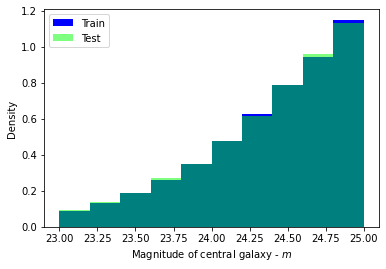

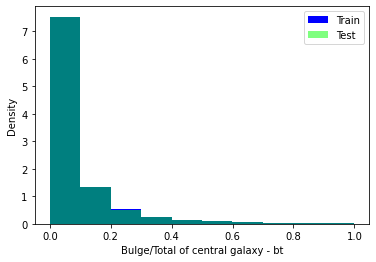

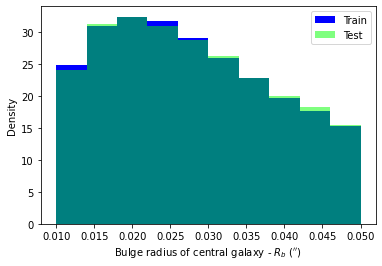

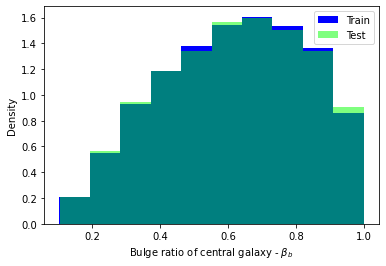

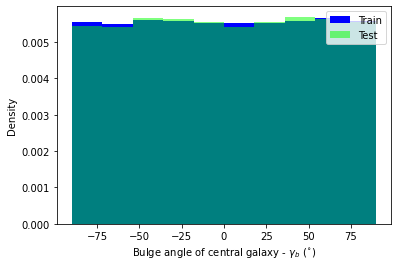

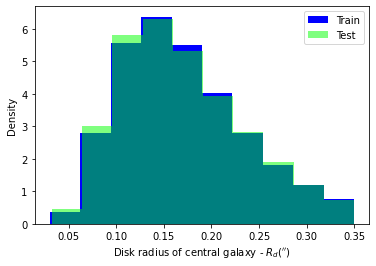

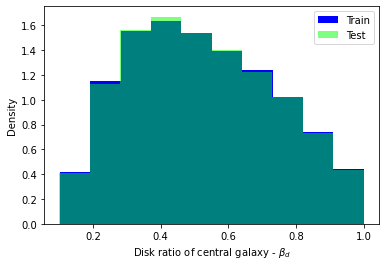

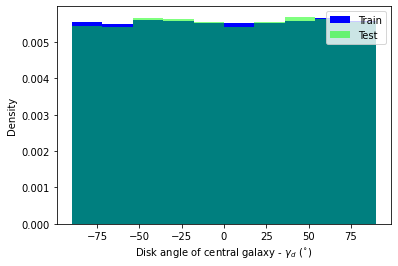

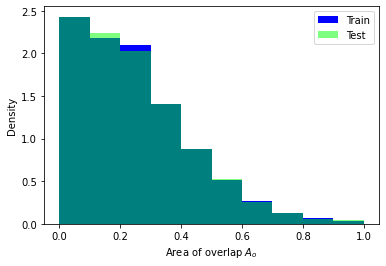

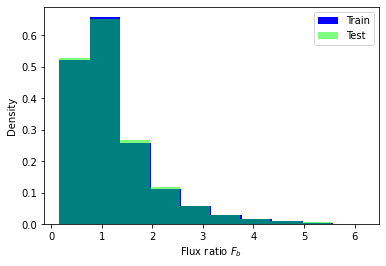

In [ ]:
properties_to_inspect = ['mag', 'bt', 'bulge_radius', 'bulge_ratio', 'bulge_angle', 'disk_radius', 'disk_ratio', 'disk_angle', 'BM_1', 'flux_ratio']
properties_to_inspect_labels = ['Magnitude of central galaxy - $m$', 'Bulge/Total of central galaxy - bt', 'Bulge radius of central galaxy - $R_b$ ($^{\prime\prime}$)', r'Bulge ratio of central galaxy - $\beta_b$', 'Bulge angle of central galaxy - $\gamma_b$ ($^{\circ}$)', 'Disk radius of central galaxy - $R_d$($^{\prime\prime}$)', r'Disk ratio of central galaxy - $\beta_d$', 'Disk angle of central galaxy - $\gamma_d$ ($^{\circ}$)', 
                                'Area of overlap $A_o$', 'Flux ratio $F_b$']

for i, p in enumerate(properties_to_inspect): 
  plt.hist(cat_train[p], density=True, label='Train',  ls='dashed', lw=1, fc=(0, 0, 1, 1))
  plt.hist(cat_test[p], density=True, label='Test',  ls='dashed', lw=1, fc=(0, 1, 0, 0.5))
  plt.xlabel(properties_to_inspect_labels[i])
  plt.ylabel('Density')
  plt.legend()
  plt.show()

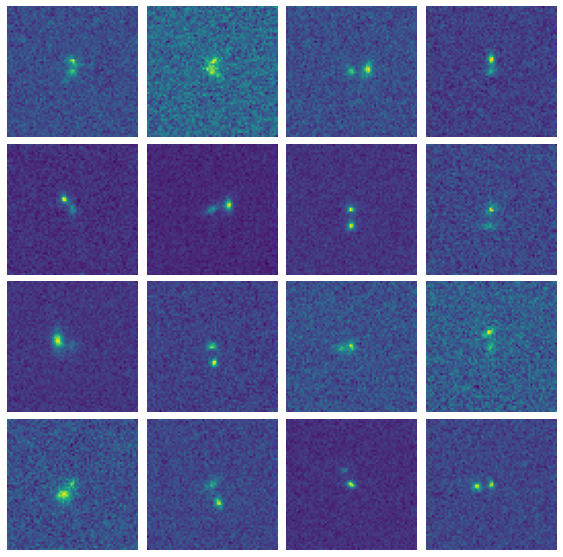

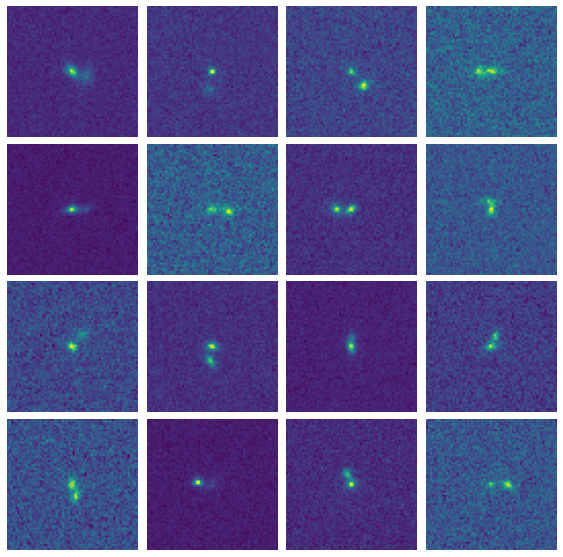

In [ ]:
random_indices_train = np.random.randint(0, np.shape(X_train)[0], 16)

fig = plt.figure(figsize=(10,10))

for i, idx in enumerate(random_indices_train):
    plt.subplot(4, 4, i+1)
    plt.imshow(X_train[idx])
    plt.axis('off')

fig.subplots_adjust(wspace=0, hspace=0.05)
# plt.suptitle('Train set examples', y=0.9, fontsize=15)
plt.show()

print("")

random_indices_test = np.random.randint(0, np.shape(X_test)[0], 16)

fig = plt.figure(figsize=(10,10))

for i, idx in enumerate(random_indices_test):
    plt.subplot(4, 4, i+1)
    plt.imshow(X_test[idx])
    plt.axis('off')

fig.subplots_adjust(wspace=0, hspace=0.05)
# plt.suptitle('Test set examples', y=0.9, fontsize=15)
plt.show()

## Expanding dimensions

In [ ]:
X_train = np.expand_dims(X_train, axis=-1) 
X_test = np.expand_dims(X_test, axis=-1)

Y_train = np.expand_dims(Y_train, axis=-1)
Y_test = np.expand_dims(Y_test, axis=-1)

# Model



In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Reshape, Conv2D, Conv2DTranspose, Dropout, BatchNormalization, MaxPool2D, Input, Lambda, add, GaussianNoise, ReLU
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import regularizers

import datetime, os
from datetime import datetime

In [ ]:
def sampling(args):
    
    mean_mu, log_var = args
    epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
    
    return mean_mu + K.exp(log_var/2)*epsilon 

In [ ]:
##5x filters 

def build_vae_encoder(input_dim, output_dim):
        
    encoder_input = Input(shape=input_dim, name='Input')

    x = Conv2D(filters=16, kernel_size=3, strides=(2,2), 
               activation='relu', input_shape=input_dim, 
               padding='same', kernel_regularizer=regularizers.L2(l2=1e-6), name='1st-Conv2D')(encoder_input)
    x = Conv2D(filters=32, kernel_size=3, strides=(2,2), 
               activation='relu',  padding='same', kernel_regularizer=regularizers.L2(l2=1e-6), name='2nd-Conv2D')(x)
    x = Conv2D(filters=64, kernel_size=3, strides=(2,2), 
               activation='relu', padding='same', kernel_regularizer=regularizers.L2(l2=1e-6), name='3rd-Conv2D')(x)
    x = Conv2D(filters=256, kernel_size=3, strides=(2,2), 
               activation='relu', padding='same', name='4th-Conv2D')(x)
    x = Flatten(name='Reshape')(x)
    x = Dense(output_dim, input_shape=[4096], 
              activation='relu', name='1st-Dense')(x)
    mu = Dense(output_dim, name=r'Mean')(x)
    log_sigma = Dense(output_dim, name=r'Sigma')(x)
    
    encoder_output = Lambda(function=sampling, name='Sample')([mu, log_sigma])
    
    return encoder_input, encoder_output, mu, log_sigma, Model(encoder_input, 
                                                               encoder_output)

def build_vae_decoder(input_dim):
            
    decoder_input = Input(shape=input_dim, name='Input')
    y = Dense(4096, activation='relu', name='1st-Dense')(decoder_input)
    y = Reshape((4, 4, 256), name='Reshape')(y)
    y = Conv2DTranspose(filters=64, kernel_size=3, strides=(2,2), 
                        padding='same',activation='relu', kernel_regularizer=regularizers.L2(l2=1e-6), name='1st-Conv2DT')(y)
    y = Conv2DTranspose(filters=32, kernel_size=3, strides=(2,2), 
                        padding='same', activation='relu', kernel_regularizer=regularizers.L2(l2=1e-6), name='2nd-Conv2DT')(y)
    y = Conv2DTranspose(filters=16, kernel_size=3, strides=(2,2), 
                        padding='same', activation='relu', kernel_regularizer=regularizers.L2(l2=1e-6), name='3rd-Conv2DT')(y)
    decoder_output = Conv2DTranspose(filters=1, kernel_size=3, 
                    strides=(2,2), padding='same', activation='sigmoid', name='4th-Conv2DT')(y)
    
    return decoder_input, decoder_output, Model(decoder_input, 
                                                decoder_output)

In [ ]:
vae_encoder_input, vae_encoder_output, mu, log_var, vae_encoder = build_vae_encoder((64,64,1), 100)
vae_decoder_input, vae_decoder_output, vae_decoder = build_vae_decoder(100)

In [ ]:
model_name = 'VAE_I_Poisson_64x64'

### Training first time


In [ ]:
# vae_input = vae_encoder_input
# vae_output = vae_decoder(vae_encoder_output)
# vae_model = Model(vae_input, vae_output)

In [ ]:
# vae_decoder.load_weights('checkpoints/checkpoint-decoder-'+model_name+'/')

In [ ]:
# vae_model.summary()

In [ ]:
# vae_model.layers[10].trainable = False

In [ ]:
# lr = 0.0005
# batch_size = 32

# loss_factor = 1
# loss_factor_kl = 5e-9

# # reconstruction loss MSE
# def r_loss(y_true, y_pred):
#     return K.mean( K.square(y_true - y_pred), axis = [1,2])

# # KL - divergence loss 
# def kl_loss(y_true, y_pred):
#     kl_loss =  -0.5 * K.sum(1 + log_var - K.square(mu) - K.exp(log_var), axis = 1)
#     return kl_loss

# def total_loss(y_true, y_pred):
#     return loss_factor * r_loss(y_true, y_pred) + loss_factor_kl*kl_loss(y_true, y_pred)

# vae_model.compile(optimizer=Adam(learning_rate = lr), loss = total_loss, metrics = [r_loss, kl_loss])

# vae_model.summary()

# early_stop = EarlyStopping(monitor='val_loss', patience=20)

In [ ]:
# ## With X, Y train where these are numpy arrays 
# vae_model.fit(X_train, Y_train, epochs = 1000, validation_data=(X_test, Y_test), callbacks=[early_stop], batch_size=batch_size)

In [ ]:
# losses = pd.DataFrame(vae_model.history.history)
# losses.columns

In [ ]:
# losses[['loss','val_loss']].plot()
# plt.yscale('log')
# plt.ylabel('Total loss; recon + kl_div')
# plt.xlabel('Epochs')

#### Saving model

In [ ]:
model_name = 'VAE_B_Poisson_64x64'

In [ ]:
# vae_model.save_weights('checkpoints/checkpoint-model-'+model_name+'/')

### Loading previously saved model


In [ ]:
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(vae_input, vae_output)

In [ ]:
lr = 0.0005
batch_size = 32

loss_factor = 1
loss_factor_kl = 5e-9

# reconstruction loss MSE
def r_loss(y_true, y_pred):
    return K.mean( K.square(y_true - y_pred), axis = [1,2])

# KL - divergence loss 
def kl_loss(y_true, y_pred):
    kl_loss =  -0.5 * K.sum(1 + log_var - K.square(mu) - K.exp(log_var), axis = 1)
    return kl_loss

def total_loss(y_true, y_pred):
    return loss_factor * r_loss(y_true, y_pred) + loss_factor_kl*kl_loss(y_true, y_pred)

In [ ]:
vae_model.load_weights('checkpoints/checkpoint-model-'+model_name+'/')

In [ ]:
vae_model.compile(optimizer=Adam(learning_rate = lr), loss = total_loss, metrics = [r_loss, kl_loss])
vae_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 1st-Conv2D (Conv2D)            (None, 32, 32, 16)   160         ['Input[0][0]']                  
                                                                                                  
 2nd-Conv2D (Conv2D)            (None, 16, 16, 32)   4640        ['1st-Conv2D[0][0]']             
                                                                                                  
 3rd-Conv2D (Conv2D)            (None, 8, 8, 64)     18496       ['2nd-Conv2D[0][0]']             
                                                                                            

### Evaluating model


In [ ]:
vae_model.evaluate(X_test, Y_test), vae_model.metrics_names

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


([1.998583899693738e-05, 1.6782513e-05, 319.4231],
 ['loss', 'r_loss', 'kl_loss'])

## Contracting dimensions

In [ ]:
Y_test_predict = vae_model.predict(X_test)
Y_test_predict = Y_test_predict.reshape((-1, 64, 64))

X_train = X_train.reshape((-1, 64, 64))
X_test = X_test.reshape((-1, 64, 64))

Y_train = Y_train.reshape((-1, 64, 64))
Y_test = Y_test.reshape((-1, 64, 64))

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


## Min-Max scaling inverse - Per Object

In [ ]:
for i in range(np.shape(X_train)[0]): 
  min, max = cat_train['MIN_IMAGE'].values[i], cat_train['MAX_IMAGE'].values[i]

  X_train[i] =  X_train[i] * (max - min) + min 
  Y_train[i] =  Y_train[i] * (max - min) + min 

for i in range(np.shape(X_test)[0]): 
  min, max = cat_test['MIN_IMAGE'].values[i], cat_test['MAX_IMAGE'].values[i]

  X_test[i] =  X_test[i] * (max - min) + min 
  Y_test[i] =  Y_test[i] * (max - min) + min 
  Y_test_predict[i] =  Y_test_predict[i] * (max - min) + min 

In [ ]:
X_train.shape, X_test.shape

((123067, 64, 64), (30767, 64, 64))

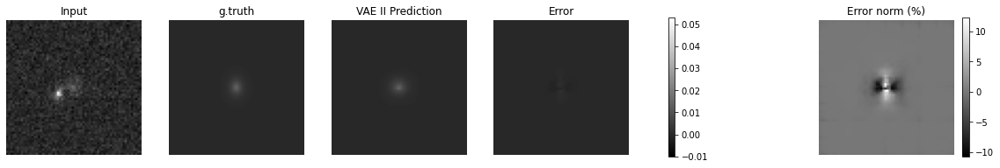

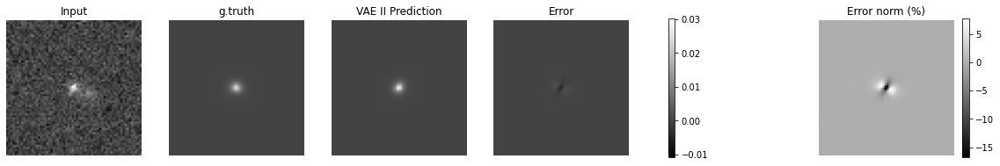

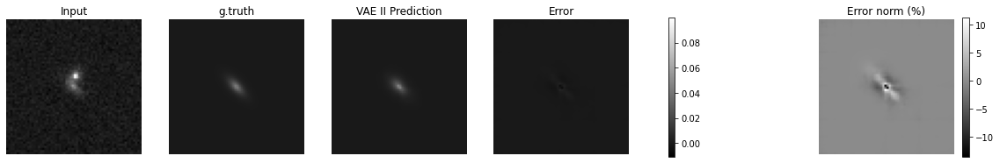

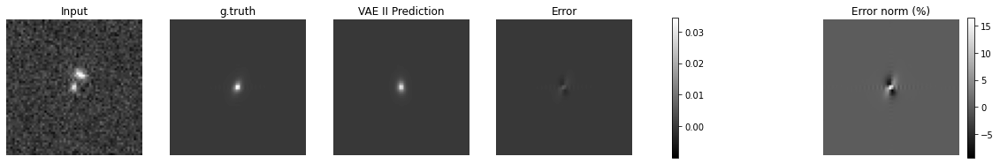

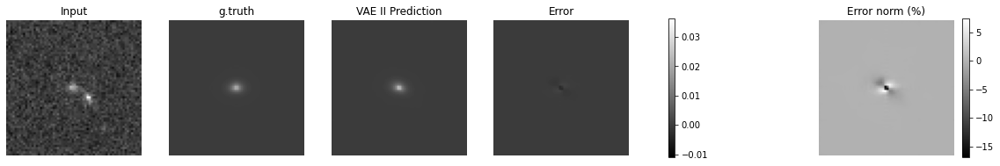

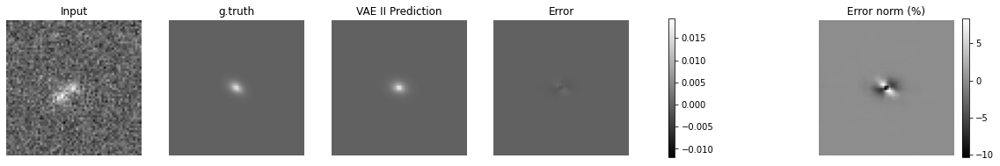

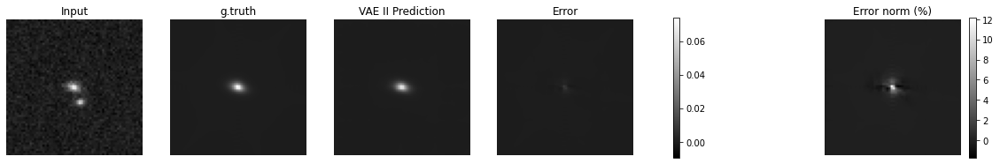

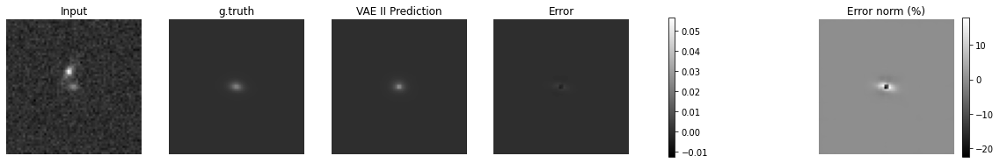

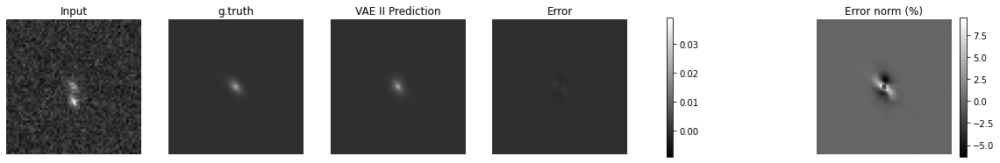

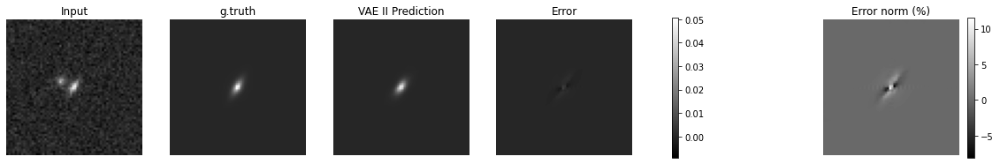

In [ ]:
for i in range(10, 20):

  n = np.random.randint(0, np.shape(Y_test)[0])

  fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

  im1 = ax0.imshow(X_test[n], cmap='gray')
  ax0.set_title('Input')
  ax0.axis('off')

  im2 = ax1.imshow(Y_test[n], cmap='gray')
  ax1.set_title('g.truth')
  ax1.axis('off')

  im3 = ax2.imshow(Y_test_predict[n], cmap='gray')
  ax2.set_title('VAE II Prediction')
  ax2.axis('off')

  im4 = ax3.imshow(Y_test[n]-Y_test_predict[n], cmap='gray')
  ax3.set_title('Error')
  ax3.axis('off')

  im5 = ax4.imshow(100 * (Y_test[n]-Y_test_predict[n])/ np.max(Y_test[n]), cmap='gray')
  ax4.set_title('Error norm (%)')
  ax4.axis('off')

  images = [im1, im2, im3, im4]
  vmin = np.min([image.get_array().min() for image in images])
  vmax = np.max([image.get_array().max() for image in images])
  norm = colors.Normalize(vmin=vmin, vmax=vmax)
  for im in images:
      im.set_norm(norm)

  fig.colorbar(images[0], ax=[ax0, ax1, ax2, ax3], shrink=0.73)
  fig.colorbar(im5, ax=[ax4], shrink=0.73)
  # fig.suptitle("Magnitude of central galaxy %.2f and half light radius %.2f" %(cat_test[n, 4], cat_test[n, 6]*0.03))

  plt.show()

## Reconstruction metrics


### MSE, CrossEntropy, CosineDistance


In [ ]:
def fnmse(yHat, y):
    return np.mean((yHat-y)**2)

def bCrossEntropy(yHat, y):
    return -np.mean(y*np.log(yHat) + (1-y)*np.log(1-yHat))

def cosinedist(yHat, y):
    
    u = yHat.flatten()
    v = y.flatten() 
    normu = np.sqrt(np.sum(u**2))
    normv = np.sqrt(np.sum(v**2)) 
    cosine_dist = np.dot(u, v) / (normu*normv)
    
    return 1 - cosine_dist

In [ ]:
n_test = np.shape(Y_test)[0]
mse, cd = np.zeros(n_test), np.zeros(n_test)
mu, std = np.zeros(n_test), np.zeros(n_test)

for i in range(n_test):
    
    yHat, y = Y_test_predict[i], Y_test[i]
    
    mse[i] += fnmse(yHat, y)
    cd[i] += cosinedist(yHat, y)
    mu[i] += np.mean(yHat - y)
    std[i] += np.std(yHat - y)

print("Mean square error", np.sum(mse)/n_test)
print("Cosine distance", np.sum(cd)/n_test)

Mean square error 3.1676066765629885e-08
Cosine distance 0.0073762175732060035


In [ ]:
def ret_running_mean(x, y, n=30): 

  a, b = np.min(x), np.max(x)
  interval = (b-a)/n 

  x_, y_ = np.zeros(n), np.zeros(n)
  
  for i in range(n):

    mask1 = a+interval*i < x
    mask2 = a+interval*(i+1) > x

    x_[i] = np.mean(x[mask1 & mask2])
    y_[i] = np.mean(y[mask1 & mask2])

  return x_, y_

def ret_running_std(x, y, n=30): 

  a, b = np.min(x), np.max(x)
  interval = (b-a)/n 

  x_, y_ = np.zeros(n), np.zeros(n)
  
  for i in range(n):

    mask1 = a+interval*i < x
    mask2 = a+interval*(i+1) > x

    x_[i] = np.mean(x[mask1 & mask2])
    y_[i] = np.std(y[mask1 & mask2])

  return x_, y_

def ret_running_median(x, y, n=30): 

  a, b = np.min(x), np.max(x)
  interval = (b-a)/n 

  x_, y_ = np.zeros(n), np.zeros(n)
  
  for i in range(n):

    mask1 = a+interval*i < x
    mask2 = a+interval*(i+1) > x

    x_[i] = np.median(x[mask1 & mask2])
    y_[i] = np.median(y[mask1 & mask2])

  return x_, y_

In [ ]:
Y_test_predict_flux = np.sum(np.sum(Y_test_predict, axis=1), axis=1)
Y_test_flux = np.sum(np.sum(Y_test, axis=1), axis=1)
Y_test_mag = FluxToMag(zp, Y_test_flux)

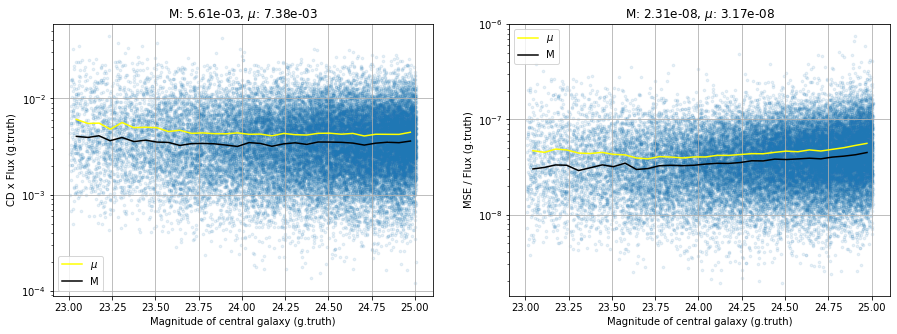

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(Y_test_mag, cd*Y_test_flux, alpha=0.1, s=7.0)

x_, cd_mean = ret_running_mean(Y_test_mag, cd*Y_test_flux)
plt.plot(x_, cd_mean, c='yellow', label=f'$\mu$')

x_, cd_median = ret_running_median(Y_test_mag, cd*Y_test_flux)
plt.plot(x_, cd_median, c='black', label=f'M')

plt.xlabel('Magnitude of central galaxy (g.truth)')
plt.ylabel('CD x Flux (g.truth)')
plt.title(f'M: {"{:.2e}".format(np.median(cd))}, $\mu$: {"{:.2e}".format(np.sum(cd) / len(cd))}')
plt.yscale('log')
plt.grid()
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(Y_test_mag, mse/Y_test_flux, alpha=0.1, s=7.0)
# plot running mean & median

x_, mse_mean = ret_running_mean(Y_test_mag, mse/Y_test_flux)
plt.plot(x_, mse_mean, c='yellow', label=f'$\mu$')

x_, mse_median = ret_running_median(Y_test_mag, mse/Y_test_flux)
plt.plot(x_, mse_median, c='black', label=f'M')

plt.xlabel('Magnitude of central galaxy (g.truth)')
plt.ylabel('MSE / Flux (g.truth)')
plt.title(f'M: {"{:.2e}".format(np.median(mse))}, $\mu$: {"{:.2e}".format(np.sum(mse) / len(mse))}')
plt.yscale('log')
plt.grid()
plt.legend()

plt.show(block=True)

### Flux error 


#### Mean image (mag, flux)

In [ ]:
mean_image = np.mean(Y_test, axis=0)
median_image = np.median(Y_test, axis=0)

In [ ]:
# plt.imshow(mean_image) 
# plt.axis('off')
# plt.show()

# plt.imshow(median_image) 
# plt.axis('off')
# plt.show()

In [ ]:
print(f'The flux of mean image is {np.sum(mean_image)} and mag is {FluxToMag(zp, np.sum(mean_image))}')
print(f'The flux of median image is {np.sum(median_image)} and mag is {FluxToMag(zp, np.sum(median_image))}')

The flux of mean image is 0.7056188583374023 and mag is 24.278574579954146
The flux of median image is 0.5402870178222656 and mag is 24.568438673019408


#### Flux error VAE v/s Truth

In [ ]:
error = (Y_test_predict_flux - Y_test_flux)/Y_test_flux

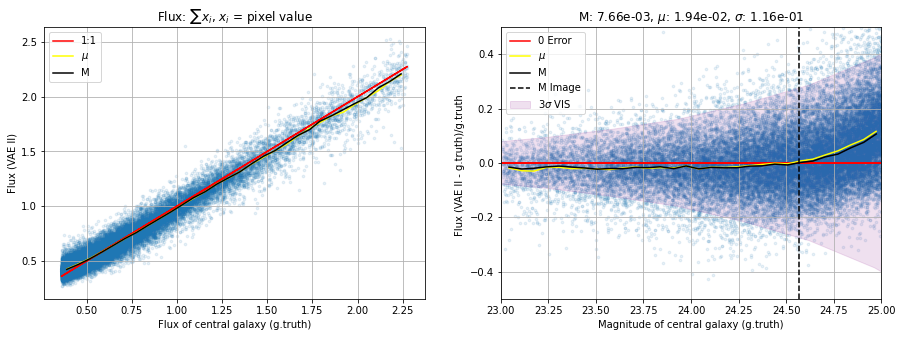

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(Y_test_flux, Y_test_predict_flux,  alpha=0.1, s=7.0)
plt.plot(Y_test_flux, Y_test_flux, c='r', label='1:1')

# plot running mean & median

x_, y_ = ret_running_mean(Y_test_flux, Y_test_predict_flux)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(Y_test_flux, Y_test_predict_flux)
plt.plot(x_, y_, c='black', label=f'M')

plt.xlabel('Flux of central galaxy (g.truth)')
plt.ylabel('Flux (VAE II)')
plt.title(f'Flux: $\sum x_i$, $x_i$ = pixel value')
plt.legend()
plt.grid()

f.add_subplot(1, 2, 2)

med = np.median(error)
avg = np.mean(error)
std = np.std(error)

plt.scatter(Y_test_mag, error, alpha=0.1, s=7.0)
plt.plot(Y_test_mag, np.zeros(np.shape(Y_test_mag)[0]), c='r', label='0 Error')

# plot running mean & median

x_, y_ = ret_running_mean(Y_test_mag, error)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(Y_test_mag, error)
plt.plot(x_, y_, c='black', label=f'M')
# plt.errorbar(expected_mags, np.zeros(np.shape(expected_mags)[0]), yerr=expected_stds, color='r')

plt.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=.12, label=f'3$\sigma$ VIS')
              
# plt.axvline(FluxToMag(zp, np.sum(mean_image)), c='black', linestyle='--', label='$\mu$ Image')
plt.axvline(FluxToMag(zp, np.sum(median_image)), c='black', linestyle='--', label='M Image')

plt.ylim(-0.5, 0.5)
plt.xlim(23, 25)

plt.xlabel('Magnitude of central galaxy (g.truth)')
plt.ylabel('Flux (VAE II - g.truth)/g.truth ')
plt.title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}')
plt.legend()
plt.grid()

plt.show(block=True)

#### Blendedness metric, Flux Ratio

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
y = np.sum(np.sum(Y_test_predict, axis=1), axis=1)

flux_ratio = cat_test['flux_ratio'].values
BM_1 = cat_test['BM_1'].values
BM_2 = cat_test['BM_2'].values
cat_test['flux'] = MagToFlux(zp, cat_test['mag'].values)

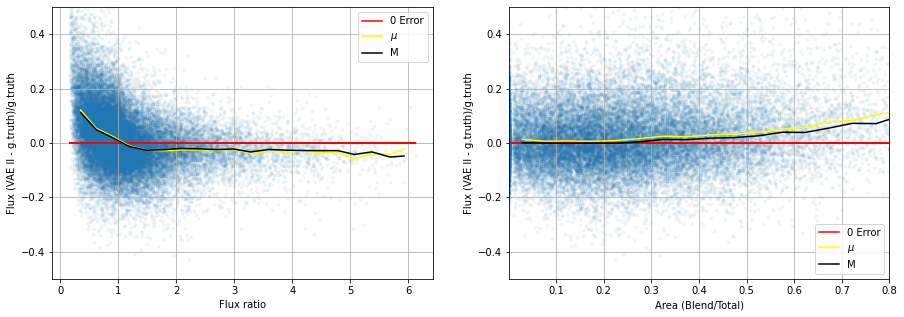

In [ ]:
f = plt.figure(figsize=(15, 5))

error = (Y_test_predict_flux - Y_test_flux)/Y_test_flux

med = np.median(error)
avg = np.mean(error)
std = np.std(error)

f.add_subplot(1, 2, 1)

plt.scatter(flux_ratio, error, alpha=0.05, s=7.0)
plt.plot(flux_ratio, np.zeros(np.shape(flux_ratio)[0]), c='r', label='0 Error')

# plot running mean & median

x_, y_ = ret_running_mean(flux_ratio, error, n=20)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(flux_ratio, error, n=20)
plt.plot(x_, y_, c='black', label=f'M')

plt.xlabel('Flux ratio')
plt.ylabel('Flux (VAE II - g.truth)/g.truth')
# plt.title(f'Errors; M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}')
plt.ylim(-0.5, 0.5)
# plt.xlim(0.01, 0.8)
plt.legend()
plt.grid()


f.add_subplot(1, 2, 2)


plt.scatter(BM_1, error, alpha=0.05, s=7.0)
plt.plot(BM_1, np.zeros(np.shape(BM_1)[0]), c='r', label='0 Error')

# plot running mean & median

x_, y_ = ret_running_mean(BM_1, error, n=20)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(BM_1, error, n=20)
plt.plot(x_, y_, c='black', label=f'M')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Flux (VAE II - g.truth)/g.truth')
# plt.title(f'Errors; M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}')
plt.ylim(-0.5, 0.5)
plt.xlim(0.001, 0.8)
plt.legend()
plt.grid()

plt.show(block=True)

#### Bins based on number of objects instead of equally spaced in BM_1 and flux_ratio


In [ ]:
N_bins = 3

In [ ]:
BM_1_n = np.shape(BM_1)[0]
flux_ratio_n = np.shape(flux_ratio)[0]

In [ ]:
N_bins_eq = N_bins
n_objs_per_bin_BM_1 = BM_1_n // N_bins_eq
n_objs_per_bin_flux_ratio = flux_ratio_n // N_bins_eq

In [ ]:
flux_ratio_edge_eq = []
BM_1_edge_eq = [] 

flux_ratio_order = np.sort(flux_ratio)
BM_1_order = np.sort(BM_1)

for i in range(N_bins_eq):

  flux_ratio_i = flux_ratio_order[i*n_objs_per_bin_flux_ratio:(i+1)*n_objs_per_bin_flux_ratio]
  flux_ratio_edge_eq.append(np.min(flux_ratio_i))

  BM_1_i = BM_1_order[i*n_objs_per_bin_BM_1:(i+1)*n_objs_per_bin_BM_1]
  BM_1_edge_eq.append(np.min(BM_1_i))

  if i == N_bins_eq-1: 
    flux_ratio_edge_eq.append(np.max(flux_ratio_i))

  if i == N_bins_eq-1: 
    BM_1_edge_eq.append(np.max(BM_1_i))

In [ ]:
### instead of equal number of objects, it's equal in bin width

# flux_ratio_edge_eq = np.linspace(np.min(flux_ratio), np.max(flux_ratio), num=N_bins+1, endpoint=True)
# BM_1_edge_eq = np.linspace(np.min(BM_1), np.max(BM_1), num=N_bins+1, endpoint=True)

### For N_bins = 3
BM_1_edge_eq = [np.min(BM_1), 0.1, 0.20, np.max(BM_1)]

# ### For N_bins = 4
# BM_1_edge_eq = [np.min(BM_1), 0.05, 0.1, 0.20, np.max(BM_1)]

# ### For N_bins = 5
# BM_1_edge_eq = [np.min(BM_1), 0.05, 0.1, 0.15, 0.20, np.max(BM_1)]

In [ ]:
## Reverse the array for the correct order in plots 
BM_1_edge_eq = BM_1_edge_eq[::-1]

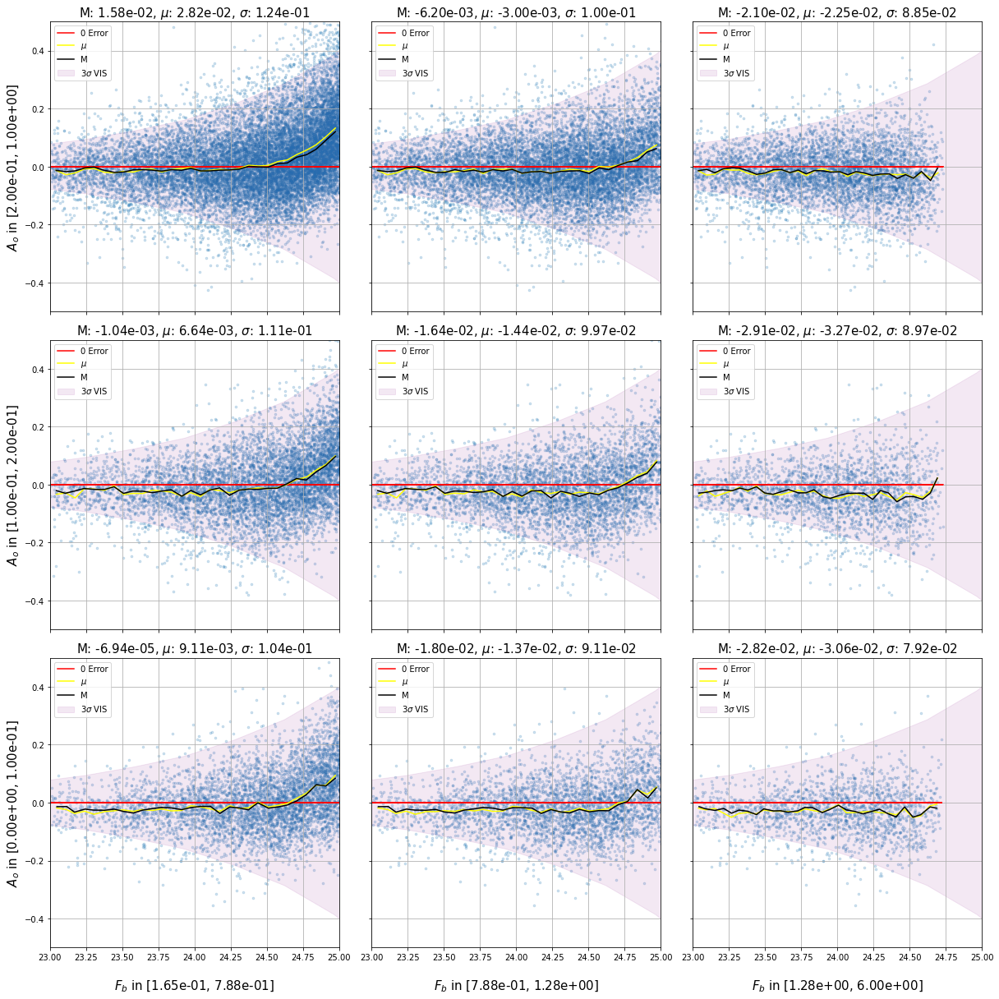

In [ ]:
fig, axes = plt.subplots(nrows=N_bins_eq, ncols=N_bins_eq, figsize=(N_bins_eq*5+2,N_bins_eq*5+2), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):

  # a is column number, and b is row number
  a, b = i%N_bins_eq, i//N_bins_eq

  mask_fr_g = flux_ratio > flux_ratio_edge_eq[a]
  mask_fr_l = flux_ratio < flux_ratio_edge_eq[a+1]
  mask_fr = mask_fr_g & mask_fr_g

  if flux_ratio_edge_eq[a] == flux_ratio_edge_eq[a+1]:
    mask_fr = flux_ratio_edge_eq[a]

  mask_BM_1_g = BM_1 < BM_1_edge_eq[b]
  mask_BM_1_l = BM_1 > BM_1_edge_eq[b+1]
  mask_BM_1 = mask_BM_1_g & mask_BM_1_l
  
  if BM_1_edge_eq[b] == BM_1_edge_eq[b+1]:
    mask_BM_1 = BM_1 == BM_1_edge_eq[b]

  mask = mask_fr & mask_BM_1

  x_mask = x[mask]
  y_mask = y[mask]

  if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
    continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask)

  ax.scatter(FluxToMag(zp, x_mask), (y_mask-x_mask)/x_mask, alpha = 0.2, s=7.0)
  ax.plot(FluxToMag(zp, x_mask), np.zeros(np.shape(x_mask)[0]), c='r', label='0 Error')

  ## plot running mean & median

  ax.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=.09, label=f'3$\sigma$ VIS')

  x_, cd_ = ret_running_mean(FluxToMag(zp, x_mask), (y_mask-x_mask)/x_mask)
  ax.plot(x_, cd_, c='yellow', label=f'$\mu$')

  x_, cd_ = ret_running_median(FluxToMag(zp, x_mask), (y_mask-x_mask)/x_mask)
  ax.plot(x_, cd_, c='black', label=f'M')

  ax.set_ylim(-0.5, 0.5)
  ax.set_xlim(23, 25)

  ax.set_title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}', fontsize=15)
  ax.legend()
  ax.grid()

  if a == 0: 
    ax.set_ylabel(f'$A_o$ in [{"{:.2e}".format(BM_1_edge_eq[b+1])}, {"{:.2e}".format(BM_1_edge_eq[b])}]',  fontsize=15)
  if b == N_bins_eq-1: 
    ax.set_xlabel(f'$F_b$ in [{"{:.2e}".format(flux_ratio_edge_eq[a])}, {"{:.2e}".format(flux_ratio_edge_eq[a+1])}]', fontsize=15, labelpad=20)

# plt.suptitle('VAE Results')
plt.tight_layout()
plt.show()

#### Summary plot VAE

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
y = np.sum(np.sum(Y_test_predict, axis=1), axis=1)

flux_ratio = cat_test['flux_ratio'].values
BM_1 = cat_test['BM_1'].values
BM_2 = cat_test['BM_2'].values

N_bins_summary = 12
N_bins_BM_1 = N_bins_summary
N_bins_fr = N_bins_summary


fr_1_bin_width = (np.max(flux_ratio) - np.min(flux_ratio))/N_bins_fr

med_VAE_fr, avg_VAE_fr, std_VAE_fr = [], [], []
fr_1_bin = []

for i in range(N_bins_fr):

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 

  mask = mask1 & mask2 

  x_mask = x[mask]
  y_mask = y[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  fr_1_bin.append(np.mean([(i+1)*fr_1_bin_width, i*fr_1_bin_width]))
  
  med_VAE_fr.append(med)
  avg_VAE_fr.append(avg)
  std_VAE_fr.append(std)

  
BM_1_bin_width = (np.max(BM_1) - np.min(BM_1))/N_bins_BM_1

med_VAE_BM, avg_VAE_BM, std_VAE_BM = [], [], []
BM_1_bin = []

for i in range(N_bins_BM_1):

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 

  mask = mask1 & mask2 
 
  x_mask = x[mask]
  y_mask = y[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  BM_1_bin.append(np.mean([(i+1)*BM_1_bin_width, i*BM_1_bin_width]))

  med_VAE_BM.append(med)
  avg_VAE_BM.append(avg)
  std_VAE_BM.append(std)

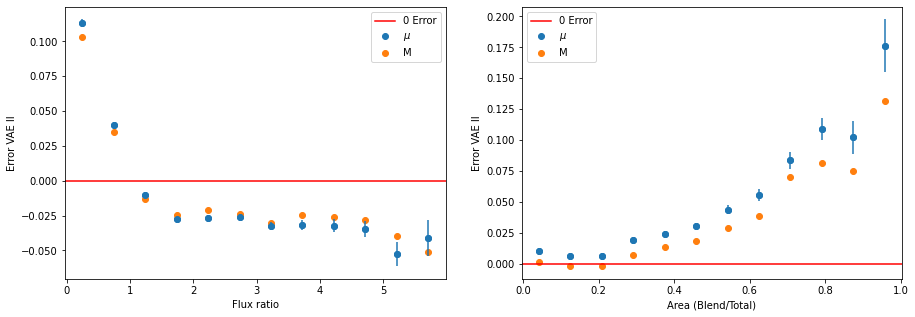

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_VAE_fr, label='$\mu$')
plt.scatter(fr_1_bin, med_VAE_fr, label='M')
plt.errorbar(fr_1_bin, avg_VAE_fr, yerr=std_VAE_fr, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error VAE II')
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_VAE_BM, label='$\mu$')
plt.scatter(BM_1_bin, med_VAE_BM, label='M')
plt.errorbar(BM_1_bin, avg_VAE_BM, yerr=std_VAE_BM, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error VAE II')
plt.legend()


# SExtractor results

In [ ]:
# read catalog 
catalog_name = data_directory+'SExtractor_results/Blended/sext_catalog_blend_X_test.csv'
cat_sext_test = pd.read_csv(catalog_name)

In [ ]:
sext_X_test_img_file = data_directory+'SExtractor_results/Blended/sext_blend_X_test_img.npy'
sext_X_test_img = np.load(sext_X_test_img_file)

sext_X_test_seg_file = data_directory+'SExtractor_results/Blended/sext_blend_X_test_seg.npy'
sext_X_test_seg = np.load(sext_X_test_seg_file)

sext_X_test_apr_file = data_directory+'SExtractor_results/Blended/sext_blend_X_test_apr.npy'
sext_X_test_apr = np.load(sext_X_test_apr_file)

#### Flux error / Magnitude All OBJECTS

In [ ]:
colors_n_objects = ['green', '#1f77b4', 'red']
n_objects_color_code = dict(zip([1.0, 2.0, 3.0], colors_n_objects))

In [ ]:
n_objects_color_code

{1.0: 'green', 2.0: '#1f77b4', 3.0: 'red'}

In [ ]:
cat_sext_test['NO_OBJECTS'].unique()

array([2., 3., 1., 4., 5., 6.])

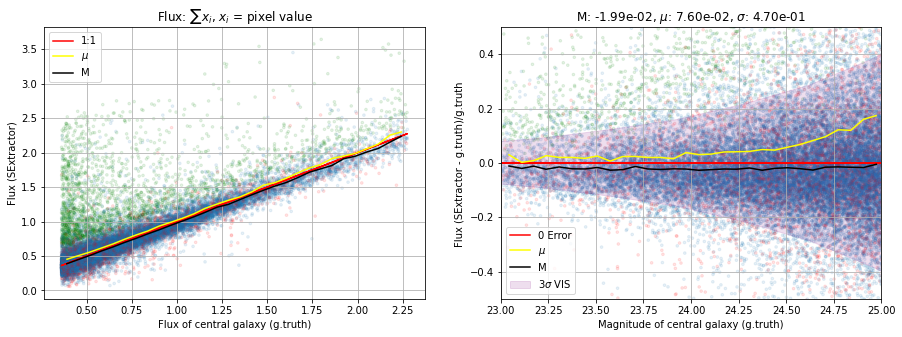

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
# y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi
y_sext = cat_sext_test['FLUX_AUTO'].values

n_objects_color_mask = [n_objects_color_code[x] if x < 3 else n_objects_color_code[3] for x in cat_sext_test['NO_OBJECTS'].values]

f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(x, y_sext, c=n_objects_color_mask, alpha=0.1, s=7.0)
plt.plot(x, x, c='r', label='1:1')

# plot running mean & median

x_, y_ = ret_running_mean(x, y_sext)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(x, y_sext)
plt.plot(x_, y_, c='black', label=f'M')

plt.xlabel('Flux of central galaxy (g.truth)')
plt.ylabel('Flux (SExtractor)')
plt.title(f'Flux: $\sum x_i$, $x_i$ = pixel value')
plt.legend()
plt.grid()
plt.legend()

f.add_subplot(1, 2, 2)

med = np.median((y_sext -x)/x)
avg = np.mean((y_sext -x)/x)
std = np.std((y_sext -x)/x)

plt.scatter(FluxToMag(zp, x), (y_sext -x)/x, c=n_objects_color_mask, alpha=0.1, s=7.0)
plt.plot(FluxToMag(zp, x), np.zeros(np.shape(x)[0]), c='r', label='0 Error')
plt.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=0.13, label=f'3$\sigma$ VIS')

# plot running mean & median

x_, cd_ = ret_running_mean(FluxToMag(zp, x), (y_sext -x)/x)
plt.plot(x_, cd_, c='yellow', label=f'$\mu$')

x_, cd_ = ret_running_median(FluxToMag(zp, x), (y_sext -x)/x)
plt.plot(x_, cd_, c='black', label=f'M')


plt.xlabel('Magnitude of central galaxy (g.truth)')
plt.ylabel('Flux (SExtractor - g.truth)/g.truth ')
plt.title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}')
plt.legend()
plt.grid()
plt.legend()
plt.ylim(-0.5, 0.5)
plt.xlim(23, 25)

plt.show(block=True)

#### Flux error / Magnitude NO_OBJECTS = 2

For number of objects == 2


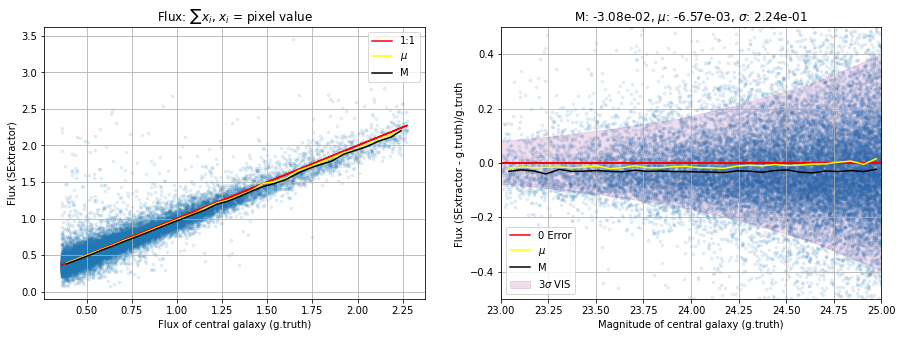

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
# y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi
y_sext = cat_sext_test['FLUX_AUTO'].values

mask = cat_sext_test['NO_OBJECTS'] == 2
x = x[mask]
y_sext = y_sext[mask]

print('For number of objects == 2')

f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(x, y_sext, alpha=0.1, s=7.0)
plt.plot(x, x, c='r', label='1:1')

# plot running mean & median

x_, y_ = ret_running_mean(x, y_sext)
plt.plot(x_, y_, c='yellow', label=f'$\mu$')

x_, y_ = ret_running_median(x, y_sext)
plt.plot(x_, y_, c='black', label=f'M')

plt.xlabel('Flux of central galaxy (g.truth)')
plt.ylabel('Flux (SExtractor)')
plt.title(f'Flux: $\sum x_i$, $x_i$ = pixel value')
plt.legend()
plt.grid()
plt.legend()

f.add_subplot(1, 2, 2)

med = np.median((y_sext - x)/x)
avg = np.mean((y_sext - x)/x)
std = np.std((y_sext - x)/x)

plt.scatter(FluxToMag(zp, x), (y_sext - x)/x, alpha=0.1, s=7.0)
plt.plot(FluxToMag(zp, x), np.zeros(np.shape(x)[0]), c='r', label='0 Error')
plt.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=0.13, label=f'3$\sigma$ VIS')

# plot running mean & median

x_, cd_ = ret_running_mean(FluxToMag(zp, x), (y_sext - x)/x)
plt.plot(x_, cd_, c='yellow', label=f'$\mu$')

x_, cd_ = ret_running_median(FluxToMag(zp, x), (y_sext - x)/x)
plt.plot(x_, cd_, c='black', label=f'M')


plt.xlabel('Magnitude of central galaxy (g.truth)')
plt.ylabel('Flux (SExtractor - g.truth)/g.truth ')
plt.title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}')
plt.legend()
plt.grid()
plt.legend()
plt.ylim(-0.5, 0.5)
plt.xlim(23, 25)

plt.show(block=True)

#### Bins based on number of objects instead of equally spaced in BM_1 and flux_ratio

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
# y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi
y_sext = cat_sext_test['FLUX_AUTO'].values

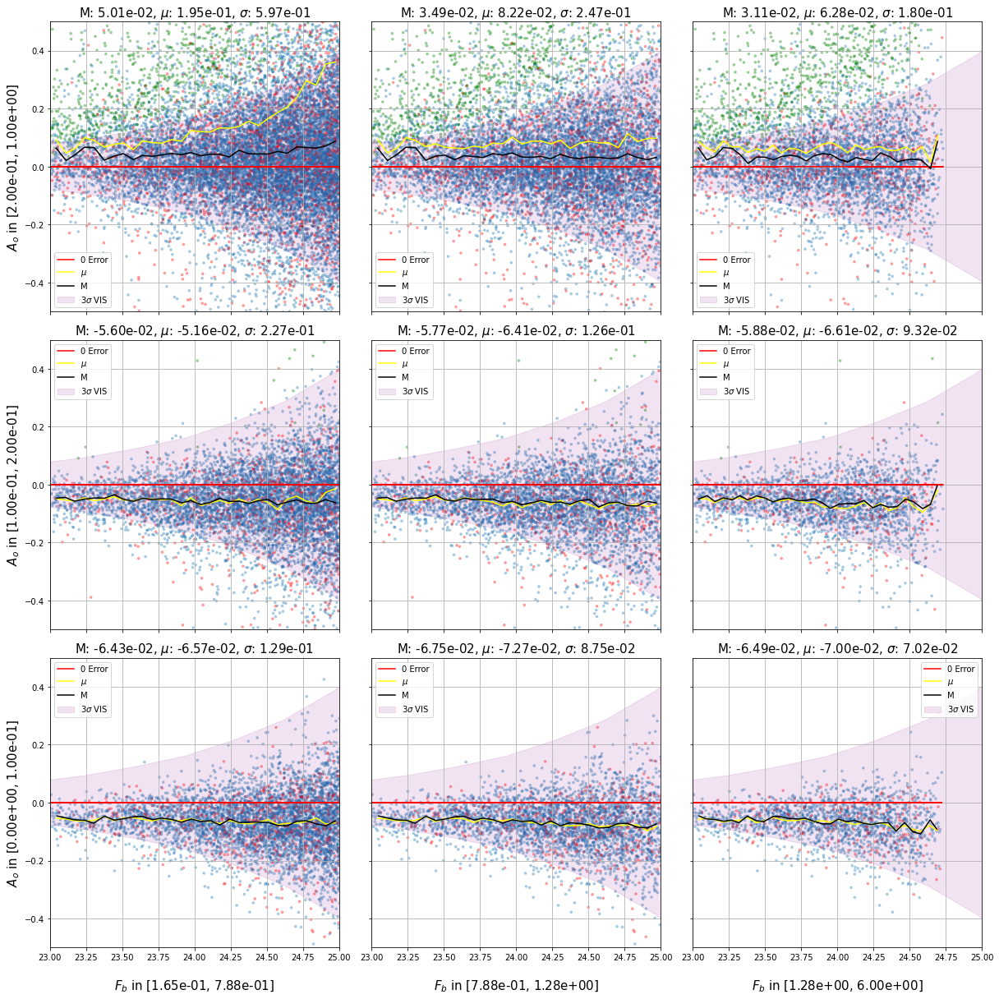

In [ ]:
fig, axes = plt.subplots(nrows=N_bins_eq, ncols=N_bins_eq, figsize=(N_bins_eq*5+2,N_bins_eq*5+2), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):

  # a is column number, and b is row number
  a, b = i%N_bins_eq, i//N_bins_eq

  mask_fr_g = flux_ratio > flux_ratio_edge_eq[a]
  mask_fr_l = flux_ratio < flux_ratio_edge_eq[a+1]
  mask_fr = mask_fr_g & mask_fr_g

  if flux_ratio_edge_eq[a] == flux_ratio_edge_eq[a+1]:
    mask_fr = flux_ratio_edge_eq[a]

  mask_BM_1_g = BM_1 < BM_1_edge_eq[b]
  mask_BM_1_l = BM_1 > BM_1_edge_eq[b+1]
  mask_BM_1 = mask_BM_1_g & mask_BM_1_l
  
  if BM_1_edge_eq[b] == BM_1_edge_eq[b+1]:
    mask_BM_1 = BM_1 == BM_1_edge_eq[b]

  mask = mask_fr & mask_BM_1 

  x_mask = x[mask]
  y_mask = y_sext[mask]
  cat_sext_n_objects_mask = cat_sext_test['NO_OBJECTS'][mask].values

  n_objects_color_mask = [n_objects_color_code[x] if x < 3 else n_objects_color_code[3] for x in cat_sext_n_objects_mask]

  if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
    continue
  
  error_mask = (y_mask - x_mask)/x_mask

  med = np.median(error_mask)
  avg = np.mean(error_mask)
  std = np.std(error_mask)

  ax.scatter(FluxToMag(zp, x_mask), error_mask,c=n_objects_color_mask, alpha = 0.3, s=7.0)
  ax.plot(FluxToMag(zp, x_mask), np.zeros(np.shape(x_mask)[0]), c='r', label='0 Error')
  ax.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=.11, label=f'3$\sigma$ VIS')

  ## plot running mean & median

  x_, cd_ = ret_running_mean(FluxToMag(zp, x_mask), error_mask)
  ax.plot(x_, cd_, c='yellow', label=f'$\mu$')

  x_, cd_ = ret_running_median(FluxToMag(zp, x_mask), error_mask)
  ax.plot(x_, cd_, c='black', label=f'M')

  ax.set_ylim(-0.5, 0.5)
  ax.set_xlim(23, 25)

  ax.set_title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}', fontsize=15)
  ax.legend()
  ax.grid()

  if a == 0: 
    ax.set_ylabel(f'$A_o$ in [{"{:.2e}".format(BM_1_edge_eq[b+1])}, {"{:.2e}".format(BM_1_edge_eq[b])}]',  fontsize=15)
  if b == N_bins_eq-1: 
    ax.set_xlabel(f'$F_b$ in [{"{:.2e}".format(flux_ratio_edge_eq[a])}, {"{:.2e}".format(flux_ratio_edge_eq[a+1])}]', fontsize=15, labelpad=20)

# fig.suptitle('SExtractor Results')
plt.tight_layout()
plt.show()

### NO_OBJECTS == 2

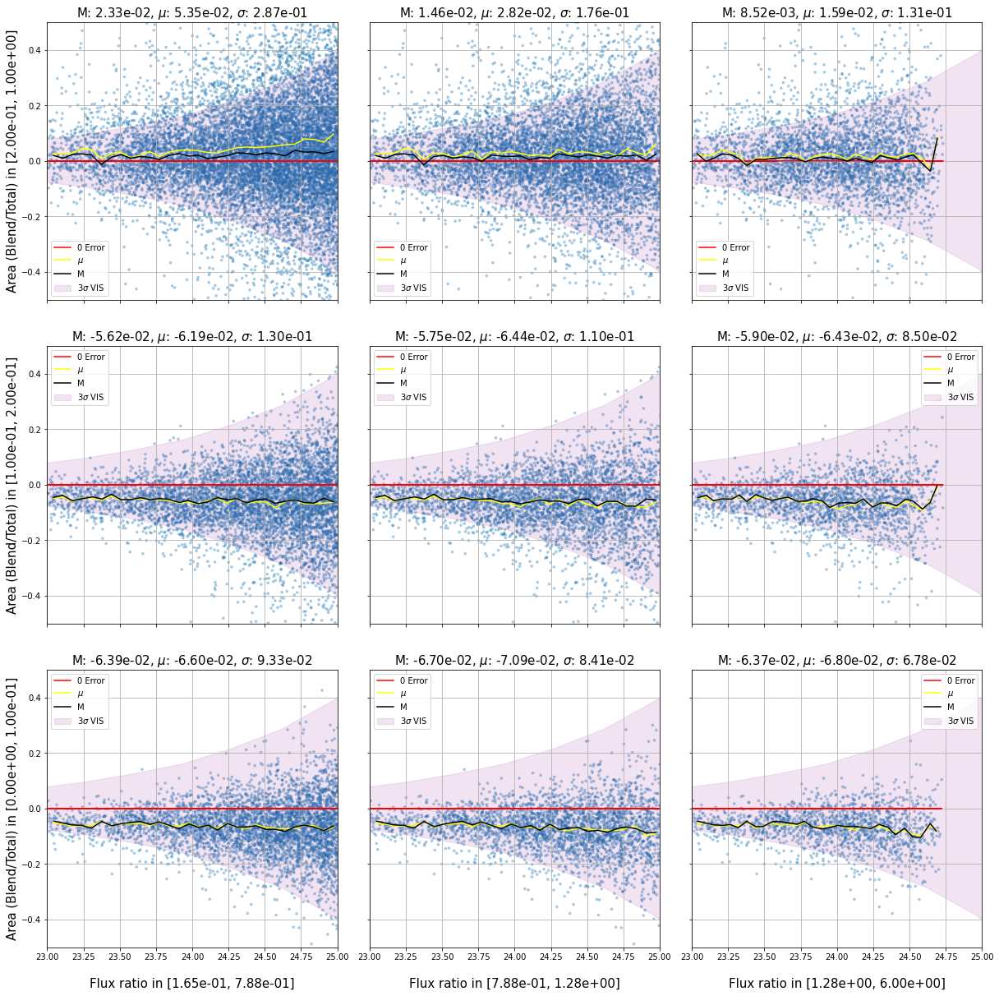

In [ ]:
fig, axes = plt.subplots(nrows=N_bins_eq, ncols=N_bins_eq, figsize=(N_bins_eq*5+2,N_bins_eq*5+2), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):

  # a is column number, and b is row number
  a, b = i%N_bins_eq, i//N_bins_eq

  mask_fr_g = flux_ratio > flux_ratio_edge_eq[a]
  mask_fr_l = flux_ratio < flux_ratio_edge_eq[a+1]
  mask_fr = mask_fr_g & mask_fr_g

  if flux_ratio_edge_eq[a] == flux_ratio_edge_eq[a+1]:
    mask_fr = flux_ratio_edge_eq[a]

  mask_BM_1_g = BM_1 < BM_1_edge_eq[b]
  mask_BM_1_l = BM_1 > BM_1_edge_eq[b+1]
  mask_BM_1 = mask_BM_1_g & mask_BM_1_l
  
  if BM_1_edge_eq[b] == BM_1_edge_eq[b+1]:
    mask_BM_1 = BM_1 == BM_1_edge_eq[b]

  mask_no_objects = cat_sext_test['NO_OBJECTS'].values == 2

  mask = mask_fr & mask_BM_1 & mask_no_objects

  x_mask = x[mask]
  y_mask = y_sext[mask]
  cat_sext_n_objects_mask = cat_sext_test['NO_OBJECTS'][mask].values

  n_objects_color_mask = [n_objects_color_code[x] if x < 3 else n_objects_color_code[3] for x in cat_sext_n_objects_mask]

  if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
    continue
  
  error_mask = (y_mask - x_mask)/x_mask

  med = np.median(error_mask)
  avg = np.mean(error_mask)
  std = np.std(error_mask)

  ax.scatter(FluxToMag(zp, x_mask), error_mask,c=n_objects_color_mask, alpha = 0.3, s=7.0)
  ax.plot(FluxToMag(zp, x_mask), np.zeros(np.shape(x_mask)[0]), c='r', label='0 Error')
  ax.fill_between(expected_mags, 0+3*np.array(expected_stds),0-3*np.array(expected_stds),color='purple',alpha=.11, label=f'3$\sigma$ VIS')

  ## plot running mean & median

  x_, cd_ = ret_running_mean(FluxToMag(zp, x_mask), error_mask)
  ax.plot(x_, cd_, c='yellow', label=f'$\mu$')

  x_, cd_ = ret_running_median(FluxToMag(zp, x_mask), error_mask)
  ax.plot(x_, cd_, c='black', label=f'M')

  ax.set_ylim(-0.5, 0.5)
  ax.set_xlim(23, 25)

  ax.set_title(f'M: {"{:.2e}".format(med)}, $\mu$: {"{:.2e}".format(avg)}, $\sigma$: {"{:.2e}".format(std)}', fontsize=15)
  ax.legend()
  ax.grid()

  if a == 0: 
    ax.set_ylabel(f'Area (Blend/Total) in [{"{:.2e}".format(BM_1_edge_eq[b+1])}, {"{:.2e}".format(BM_1_edge_eq[b])}]',  fontsize=15)
  if b == N_bins_eq-1: 
    ax.set_xlabel(f'Flux ratio in [{"{:.2e}".format(flux_ratio_edge_eq[a])}, {"{:.2e}".format(flux_ratio_edge_eq[a+1])}]', fontsize=15, labelpad=20)

# fig.suptitle('SExtractor Results')
plt.tight_layout()
plt.show()

# Summary plot 

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
y = np.sum(np.sum(Y_test_predict, axis=1), axis=1)
y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi
y_sext = cat_sext_test['FLUX_AUTO'].values

### NO_OBJECTS == 2

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)

N_bins_summary = 12
N_bins_BM_1 = N_bins_summary
N_bins_fr = N_bins_summary

fr_1_bin_width = (np.max(flux_ratio) - np.min(flux_ratio))/N_bins_fr

med_sext_fr, avg_sext_fr, std_sext_fr = [], [], []
fr_1_bin = []

for i in range(N_bins_fr):

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2

  mask = mask1 & mask2 & mask3 

  fr_1_bin.append(np.mean([(i+1)*fr_1_bin_width, i*fr_1_bin_width]))

  x_mask = x[mask]
  y_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_sext_fr.append(med)
  avg_sext_fr.append(avg)
  std_sext_fr.append(std)

BM_1_bin_width = (np.max(BM_1) - np.min(BM_1))/N_bins_BM_1

med_sext_BM, avg_sext_BM, std_sext_BM = [], [], []
BM_1_bin = []

for i in range(N_bins_BM_1):

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2
  
  mask = mask1 & mask2 & mask3

  BM_1_bin.append(np.mean([(i+1)*BM_1_bin_width, i*BM_1_bin_width]))
 
  x_mask = x[mask]
  y_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_BM.append(med)
  avg_sext_BM.append(avg)
  std_sext_BM.append(std)

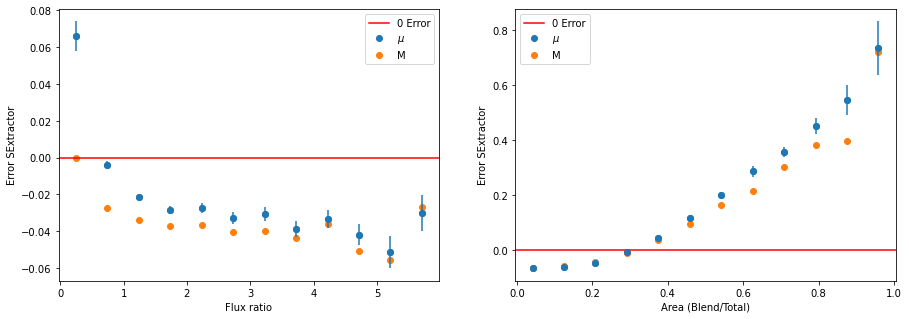

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_sext_fr, label='$\mu$')
plt.scatter(fr_1_bin, med_sext_fr, label='M')
plt.errorbar(fr_1_bin, avg_sext_fr, yerr=std_sext_fr, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error SExtractor')
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_sext_BM, label='$\mu$')
plt.scatter(BM_1_bin, med_sext_BM, label='M')
plt.errorbar(BM_1_bin, avg_sext_BM, yerr=std_sext_BM, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error SExtractor')
plt.legend()


### All objects

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)

N_bins_summary = 12
N_bins_BM_1 = N_bins_summary
N_bins_fr = N_bins_summary

fr_1_bin_width = (np.max(flux_ratio) - np.min(flux_ratio))/N_bins_fr

med_sext_fr, avg_sext_fr, std_sext_fr = [], [], []
fr_1_bin = []

for i in range(N_bins_fr):

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 
  fr_1_bin.append(np.mean([(i+1)*fr_1_bin_width, i*fr_1_bin_width]))
  
  mask = mask1 & mask2 
 
  x_mask = x[mask]
  y_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_fr.append(med)
  avg_sext_fr.append(avg)
  std_sext_fr.append(std)

BM_1_bin_width = (np.max(BM_1) - np.min(BM_1))/N_bins_BM_1

med_sext_BM, avg_sext_BM, std_sext_BM = [], [], []
BM_1_bin = []

for i in range(N_bins_BM_1):

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 
  BM_1_bin.append(np.mean([(i+1)*BM_1_bin_width, i*BM_1_bin_width]))

  mask = mask1 & mask2 
 
  x_mask = x[mask]
  y_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_BM.append(med)
  avg_sext_BM.append(avg)
  std_sext_BM.append(std)

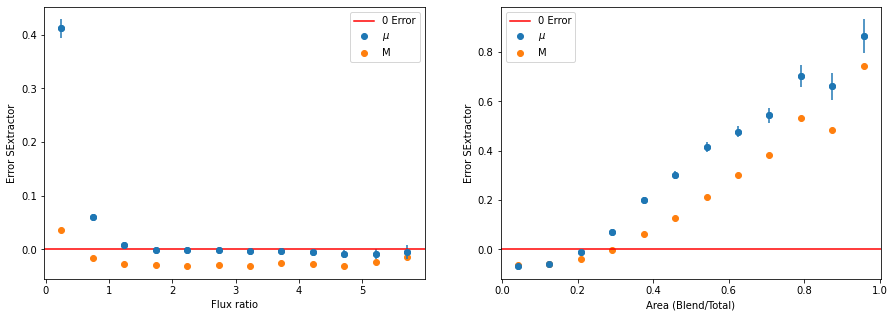

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_sext_fr, label='$\mu$')
plt.scatter(fr_1_bin, med_sext_fr, label='M')
plt.errorbar(fr_1_bin, avg_sext_fr, yerr=std_sext_fr, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error SExtractor')
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_sext_BM, label='$\mu$')
plt.scatter(BM_1_bin, med_sext_BM, label='M')
plt.errorbar(BM_1_bin, avg_sext_BM, yerr=std_sext_BM, fmt='o')
plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error SExtractor')
plt.legend()


## SExtractor v/s VAE

### 'All cases'

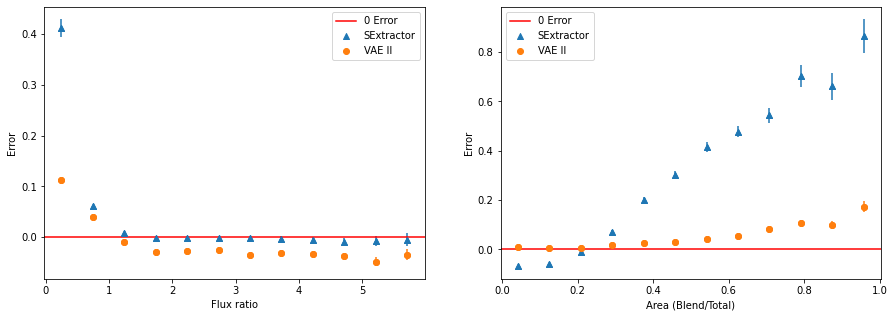

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_sext_fr, label='SExtractor', marker='^')
# plt.scatter(fr_1_bin, med_sext_fr, label='M SExtractor', marker='^')
plt.errorbar(fr_1_bin, avg_sext_fr, yerr=std_sext_fr, fmt='^')

plt.scatter(fr_1_bin, avg_VAE_fr, label='VAE II')
# plt.scatter(fr_1_bin, med_VAE_fr, label='M VAE')
plt.errorbar(fr_1_bin, avg_VAE_fr, yerr=std_VAE_fr, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error')
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_sext_BM, label='SExtractor', marker='^')
# plt.scatter(BM_1_bin, med_sext_BM, label='M SExtractor', marker='^')
plt.errorbar(BM_1_bin, avg_sext_BM, yerr=std_sext_BM, fmt='^')

plt.scatter(BM_1_bin, avg_VAE_BM, label='VAE II')
# plt.scatter(BM_1_bin, med_VAE_BM, label='M VAE')
plt.errorbar(BM_1_bin, avg_VAE_BM, yerr=std_VAE_BM, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error')
plt.legend()


### 'Good cases' for both VAE and SExtractor
Where SExtractor finds NO_Objects == 2

In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
y = np.sum(np.sum(Y_test_predict, axis=1), axis=1)
y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi

N_bins_summary = 10
N_bins_BM_1 = N_bins_summary
N_bins_fr = N_bins_summary

fr_1_bin_width = (np.max(flux_ratio) - np.min(flux_ratio))/N_bins_fr

med_sext_fr, avg_sext_fr, std_sext_fr = [], [], []
med_VAE_fr, avg_VAE_fr, std_VAE_fr = [], [], []

fr_1_bin = []

for i in range(N_bins_fr):

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2

  mask = mask1 & mask2 & mask3 

  fr_1_bin.append(np.mean([(i+1)*fr_1_bin_width, i*fr_1_bin_width]))

  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0 or np.shape(y_sext_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_VAE_fr.append(med)
  avg_VAE_fr.append(avg)
  std_VAE_fr.append(std)

  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_sext_fr.append(med)
  avg_sext_fr.append(avg)
  std_sext_fr.append(std)

BM_1_bin_width = (np.max(BM_1) - np.min(BM_1))/N_bins_BM_1

med_sext_BM, avg_sext_BM, std_sext_BM = [], [], []
med_VAE_BM, avg_VAE_BM, std_VAE_BM = [], [], []
BM_1_bin = []

for i in range(N_bins_BM_1):

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2
  
  mask = mask1 & mask2 & mask3

  BM_1_bin.append(np.mean([(i+1)*BM_1_bin_width, i*BM_1_bin_width]))
 
  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0 or np.shape(y_sext_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_VAE_BM.append(med)
  avg_VAE_BM.append(avg)
  std_VAE_BM.append(std)  
  
  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_BM.append(med)
  avg_sext_BM.append(avg)
  std_sext_BM.append(std)

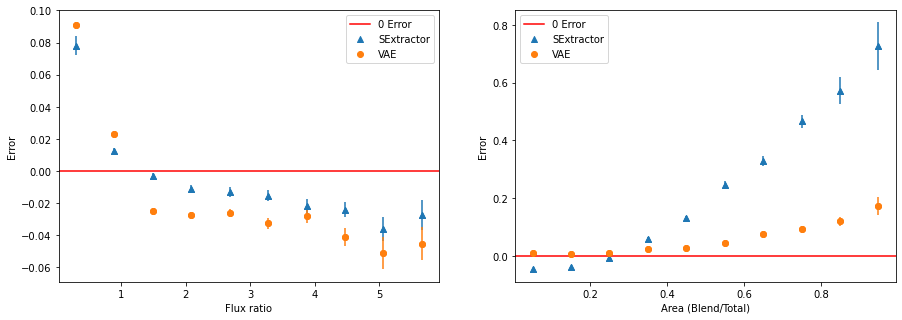

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_sext_fr, label='SExtractor', marker='^')
# plt.scatter(fr_1_bin, med_sext_fr, label='M SExtractor', marker='^')
plt.errorbar(fr_1_bin, avg_sext_fr, yerr=std_sext_fr, fmt='^')

plt.scatter(fr_1_bin, avg_VAE_fr, label='VAE')
# plt.scatter(fr_1_bin, med_VAE_fr, label='M VAE')
plt.errorbar(fr_1_bin, avg_VAE_fr, yerr=std_VAE_fr, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error')
plt.legend()

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_sext_BM, label='SExtractor', marker='^')
# plt.scatter(BM_1_bin, med_sext_BM, label='M SExtractor', marker='^')
plt.errorbar(BM_1_bin, avg_sext_BM, yerr=std_sext_BM, fmt='^')

plt.scatter(BM_1_bin, avg_VAE_BM, label='VAE')
# plt.scatter(BM_1_bin, med_VAE_BM, label='M VAE')
plt.errorbar(BM_1_bin, avg_VAE_BM, yerr=std_VAE_BM, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error')
plt.legend()


In [ ]:
x = np.sum(np.sum(Y_test, axis=1), axis=1)
y = np.sum(np.sum(Y_test_predict, axis=1), axis=1)
y_sext = cat_sext_test['FLUX_AUTO'].values + cat_sext_test['BACKGROUND']*cat_sext_test['KRON_RADIUS']**2*cat_sext_test['A_IMAGE']*cat_sext_test['B_IMAGE'].values*np.pi

N_bins_summary = 10
N_bins_BM_1 = N_bins_summary
N_bins_fr = N_bins_summary

fr_1_bin_width = (np.max(flux_ratio) - np.min(flux_ratio))/N_bins_fr

med_sext_fr, avg_sext_fr, std_sext_fr = [], [], []
med_sext_fr_all, avg_sext_fr_all, std_sext_fr_all = [], [], []
med_VAE_fr, avg_VAE_fr, std_VAE_fr = [], [], []

fr_1_bin = []

for i in range(N_bins_fr):

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2

  mask = mask1 & mask2 & mask3 

  fr_1_bin.append(np.mean([(i+1)*fr_1_bin_width, i*fr_1_bin_width]))

  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0 or np.shape(y_sext_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_VAE_fr.append(med)
  avg_VAE_fr.append(avg)
  std_VAE_fr.append(std)

  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_sext_fr.append(med)
  avg_sext_fr.append(avg)
  std_sext_fr.append(std)

  ### all 

  mask1 = flux_ratio < (i+1)*fr_1_bin_width
  mask2 = flux_ratio > i*fr_1_bin_width 

  mask = mask1 & mask2 

  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0])

  med_sext_fr_all.append(med)
  avg_sext_fr_all.append(avg)
  std_sext_fr_all.append(std)

BM_1_bin_width = (np.max(BM_1) - np.min(BM_1))/N_bins_BM_1

med_sext_BM, avg_sext_BM, std_sext_BM = [], [], []
med_sext_BM_all, avg_sext_BM_all, std_sext_BM_all = [], [], []

med_VAE_BM, avg_VAE_BM, std_VAE_BM = [], [], []
BM_1_bin = []

for i in range(N_bins_BM_1):

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 
  mask3 = cat_sext_test['NO_OBJECTS'] == 2
  
  mask = mask1 & mask2 & mask3

  BM_1_bin.append(np.mean([(i+1)*BM_1_bin_width, i*BM_1_bin_width]))
 
  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  # if np.shape(x_mask)[0] == 0 or np.shape(y_mask)[0] == 0 or np.shape(y_sext_mask)[0] == 0:
  #   continue

  med = np.median((y_mask-x_mask)/x_mask)
  avg = np.mean((y_mask-x_mask)/x_mask)
  std = np.std((y_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_VAE_BM.append(med)
  avg_VAE_BM.append(avg)
  std_VAE_BM.append(std)  
  
  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_BM.append(med)
  avg_sext_BM.append(avg)
  std_sext_BM.append(std)

  ### all 

  mask1 = BM_1 < (i+1)*BM_1_bin_width
  mask2 = BM_1 > i*BM_1_bin_width 
  
  mask = mask1 & mask2 
 
  x_mask = x[mask]
  y_mask = y[mask]
  y_sext_mask = y_sext[mask]

  med = np.median((y_sext_mask-x_mask)/x_mask)
  avg = np.mean((y_sext_mask-x_mask)/x_mask)
  std = np.std((y_sext_mask-x_mask)/x_mask) / np.sqrt(np.shape(x_mask)[0]) 

  med_sext_BM_all.append(med)
  avg_sext_BM_all.append(avg)
  std_sext_BM_all.append(std)

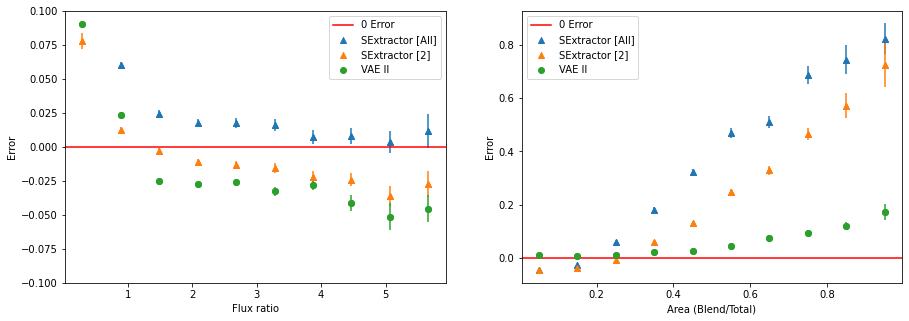

In [ ]:
f = plt.figure(figsize=(15, 5))

f.add_subplot(1, 2, 1)

plt.scatter(fr_1_bin, avg_sext_fr_all, label='SExtractor [All]', marker='^')
plt.errorbar(fr_1_bin, avg_sext_fr_all, yerr=std_sext_fr_all, fmt='^')

plt.scatter(fr_1_bin, avg_sext_fr, label='SExtractor [2]', marker='^')
plt.errorbar(fr_1_bin, avg_sext_fr, yerr=std_sext_fr, fmt='^')


plt.scatter(fr_1_bin, avg_VAE_fr, label='VAE II')
plt.errorbar(fr_1_bin, avg_VAE_fr, yerr=std_VAE_fr, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Flux ratio')
plt.ylabel('Error')
plt.legend()
plt.ylim(-0.1, 0.1)

f.add_subplot(1, 2, 2)

plt.scatter(BM_1_bin, avg_sext_BM_all, label='SExtractor [All]', marker='^')
plt.errorbar(BM_1_bin, avg_sext_BM_all, yerr=std_sext_BM_all, fmt='^')

plt.scatter(BM_1_bin, avg_sext_BM, label='SExtractor [2]', marker='^')
plt.errorbar(BM_1_bin, avg_sext_BM, yerr=std_sext_BM, fmt='^')

plt.scatter(BM_1_bin, avg_VAE_BM, label='VAE II')
plt.errorbar(BM_1_bin, avg_VAE_BM, yerr=std_VAE_BM, fmt='o')

plt.axhline(y=0, color='red', label='0 Error')

plt.xlabel('Area (Blend/Total)')
plt.ylabel('Error')
plt.legend()


In [ ]:
cat_sext_test['ERROR_VAE'] = (x-y)/x
cat_sext_test['TEST_VAE_MAG'] = cat_test['mag'].values
cat_sext_test['ERROR_SEXT'] = (x-y_sext)/x

cat_sext_test['SEXT_BKG_CORRECT_FLUX'] = y_sext
cat_sext_test['BM_1'] = cat_test['BM_1'].values
cat_sext_test['BM_2'] = cat_test['BM_2'].values
cat_sext_test['flux_ratio'] = flux_ratio

In [ ]:
# BM_1s, FRs = cat_sext_test['BM_1'].values, cat_sext_test['flux_ratio'].values

# # Min BM_1, Min FR
# min_BM_1, min_FR = np.min(BM_1s), np.min(FRs)

# # Max BM_1, Max FR
# max_BM_1, max_FR = np.max(BM_1s), np.max(FRs)

# # # Left bottom
# # mask = np.sqrt((BM_1s - min_BM_1)**2 + (FRs - min_FR)**2) == np.min(np.sqrt((BM_1s - min_BM_1)**2 + (FRs - min_FR)**2))
# # print('Left bottom')

# # # Left Top 
# # mask = np.sqrt((BM_1s - max_BM_1)**2 + (FRs - min_FR)**2) == np.min(np.sqrt((BM_1s - max_BM_1)**2 + (FRs - min_FR)**2))
# # print('Left top')

# # # Right bottom 
# # mask = np.sqrt((BM_1s - min_BM_1)**2 + (FRs - max_BM_1)**2) == np.min(np.sqrt((BM_1s - min_BM_1)**2 + (FRs - max_BM_1)**2))
# # print('Right bottom')

# # # Right Top 
# # mask = np.sqrt((BM_1s - max_BM_1)**2 + (FRs - max_FR)**2) == np.min(np.sqrt((BM_1s - max_BM_1)**2 + (FRs - max_FR)**2))
# # print('Right top')

# objs = X_test[mask]

# plt.imshow(objs[0], cmap='gray')
# plt.axis('off')
# plt.show()

## When NO_OBJECTS == 1
SExtractor unable to deblend

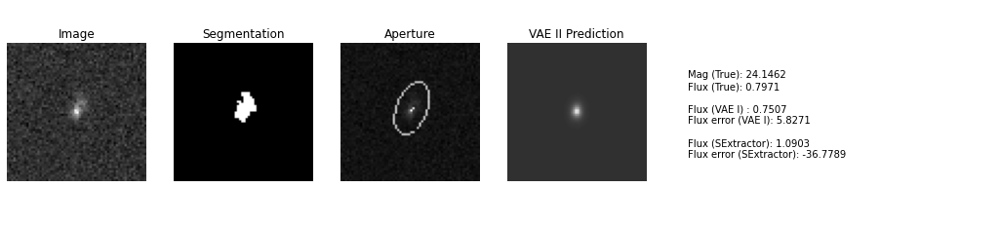

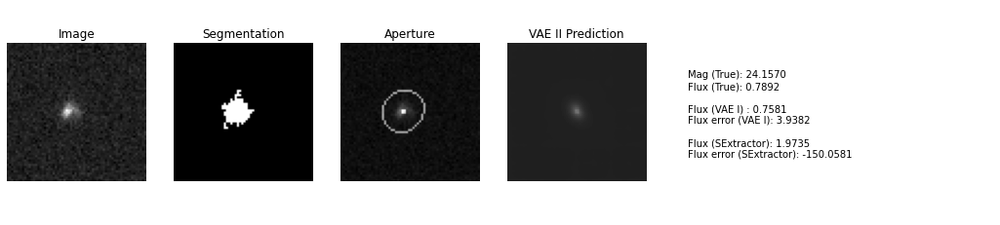

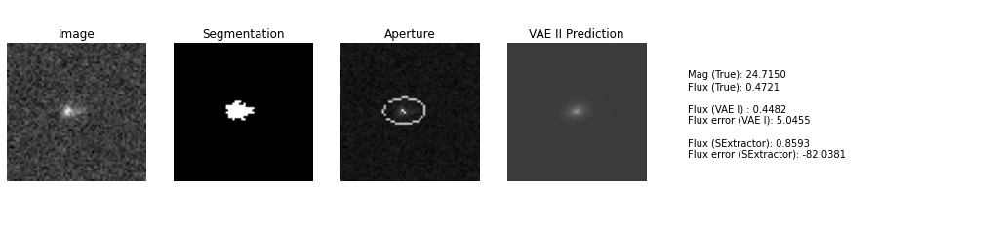

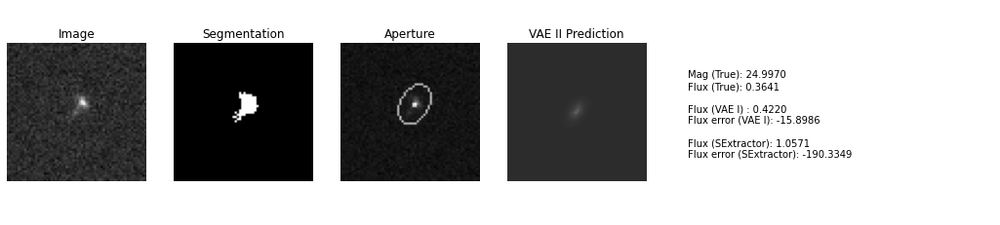

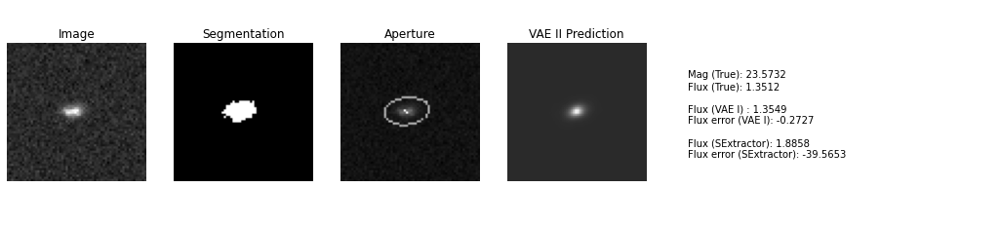

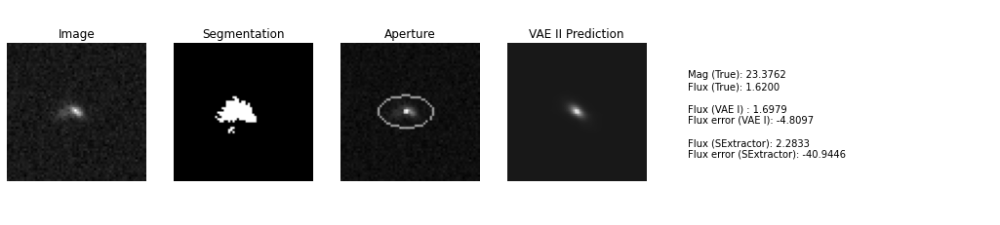

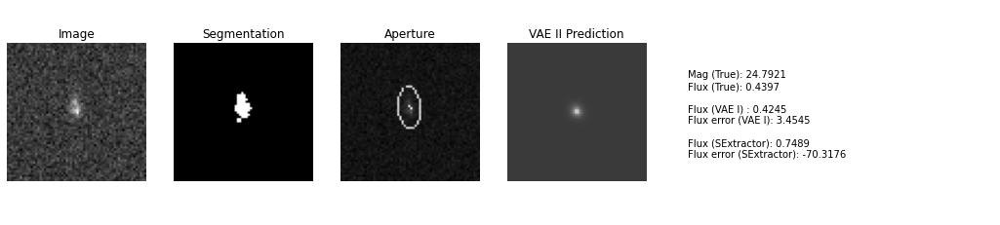

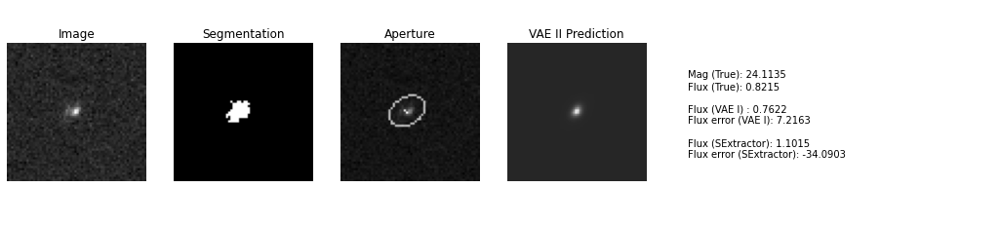

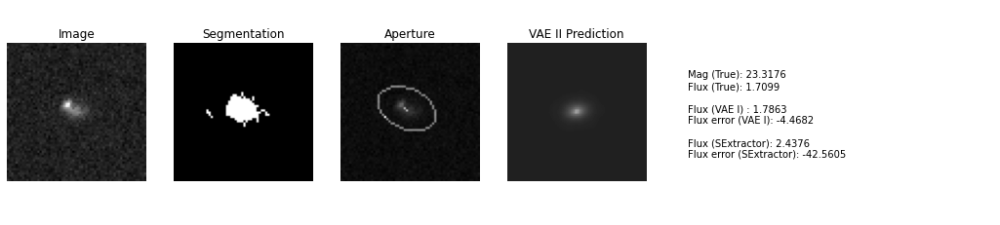

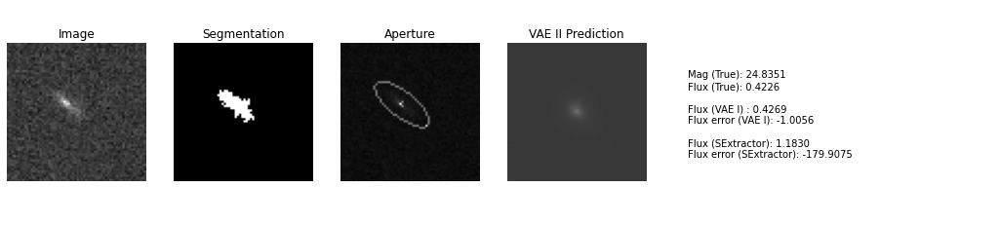

In [ ]:
pixel_scale = 0.1 

for n in cat_sext_test[(cat_sext_test['NO_OBJECTS'] == 1)].index.tolist()[:10]: 

  ### SExtractor 

  fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(14.8, 4))

  im1 = ax0.imshow(sext_X_test_img[n], cmap='gray')
  ax0.set_title('Image')
  ax0.axis('off')

  im2 = ax1.imshow(sext_X_test_seg[n], cmap='gray')
  ax1.set_title('Segmentation')
  ax1.axis('off')

  im3 = ax2.imshow(sext_X_test_apr[n], cmap='gray')
  ax2.set_title('Aperture')
  ax2.axis('off')

  im4 = ax3.imshow(Y_test_predict[n], cmap='gray')
  ax3.set_title('VAE II Prediction')
  ax3.axis('off')

  images = [im1, im4]
  vmin = np.min([image.get_array().min() for image in images])
  vmax = np.max([image.get_array().max() for image in images])
  norm = colors.Normalize(vmin=vmin, vmax=vmax)
  for im in images:
      im.set_norm(norm)

  catalog_mag = cat_test.iloc[n, 4]
  catalog_flux = MagToFlux(zp, catalog_mag)
  catalog_rad = cat_test.iloc[n, 7]*pixel_scale

  vae_flux = np.sum(Y_test_predict[n])
  vae_mag = FluxToMag(zp, vae_flux)

  vae_error_flux = (catalog_flux-vae_flux)*100/catalog_flux
  vae_error_mag = (catalog_mag-vae_mag)*100/catalog_mag

  sext_flux = cat_sext_test.loc[n, 'SEXT_BKG_CORRECT_FLUX']
  sext_error_flux = (catalog_flux-sext_flux)*100/catalog_flux
  sext_n = cat_sext_test.loc[n, 'NO_OBJECTS']

  if sext_flux == 0: 
    sext_mag = None
    sext_error_mag = None 
  else: 
    sext_mag = FluxToMag(zp, sext_flux)
    sext_error_mag = (catalog_mag-sext_mag)*100/catalog_mag

  info = f"Mag (True): {format(catalog_mag, '.4f')}\nFlux (True): {format(catalog_flux, '.4f')}\n\nFlux (VAE I) : {format(vae_flux, '.4f')}\nFlux error (VAE I): {format(vae_error_flux, '.4f')}\n\nFlux (SExtractor): {format(sext_flux, '.4f')}\nFlux error (SExtractor): {format(sext_error_flux, '.4f')}"

  left, width = 0, 3.5
  bottom, height = 0.18, 0.66
  right = left + width
  top = bottom + height
  p = plt.Rectangle((left, bottom), width, height, fill=False, linewidth=0)
  p.set_transform(ax3.transAxes)
  p.set_clip_on(False)
  ax4.add_patch(p)
  ax4.axis('off')

  ax4.text(left+0.1, top-0.35, info,
        horizontalalignment='left',
        verticalalignment='center',
        transform=ax4.transAxes)

  ax4.axis('off')

  plt.show()

## When NO_OBJECTS > 2
SExtractor deblends too much

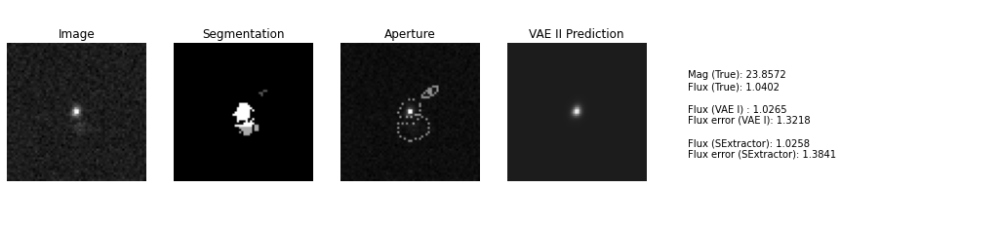

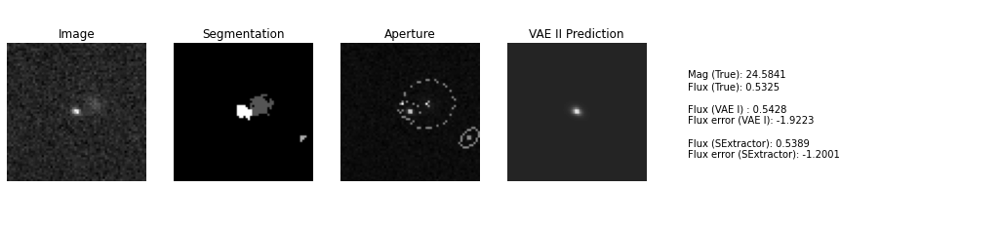

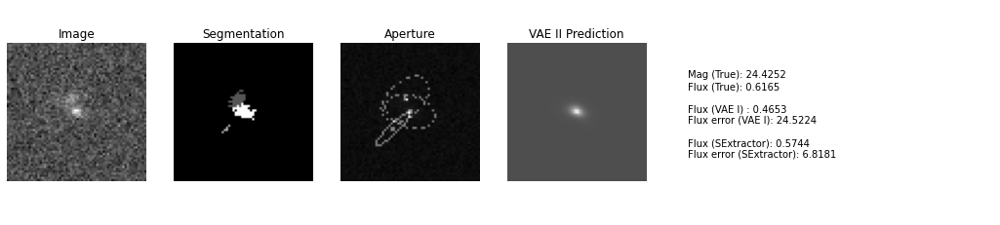

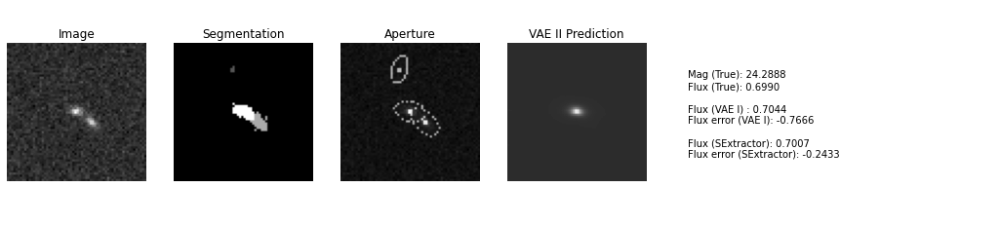

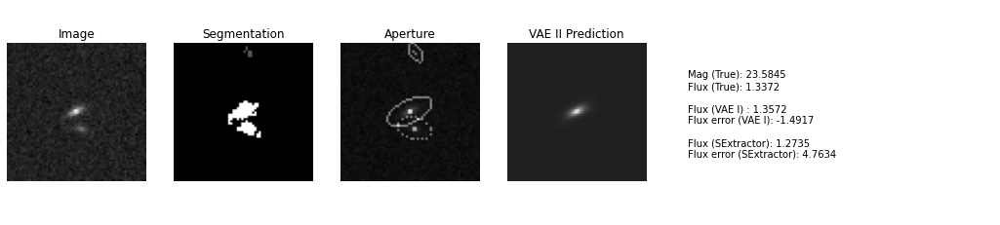

...

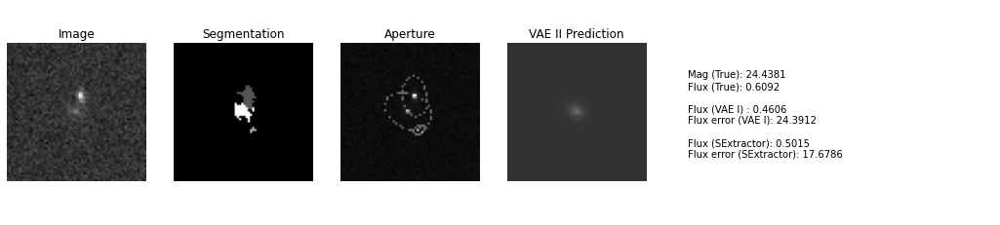

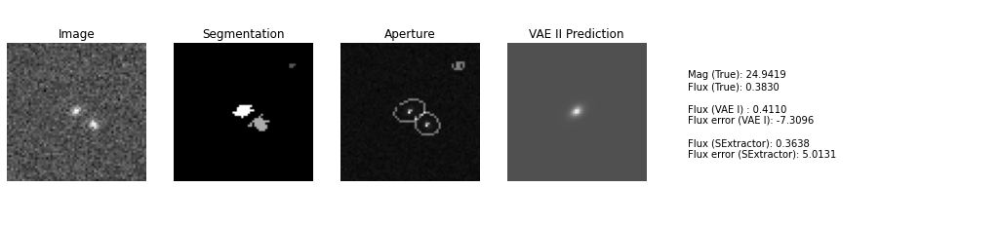

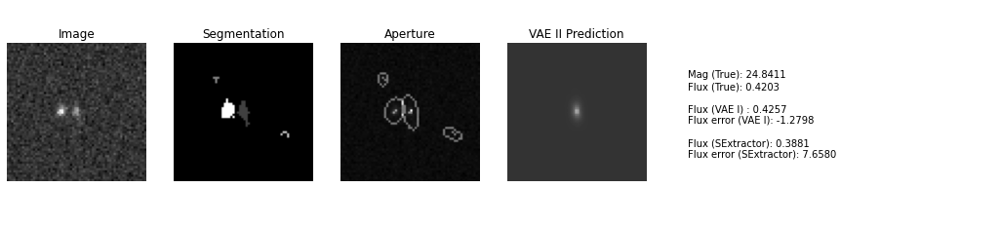

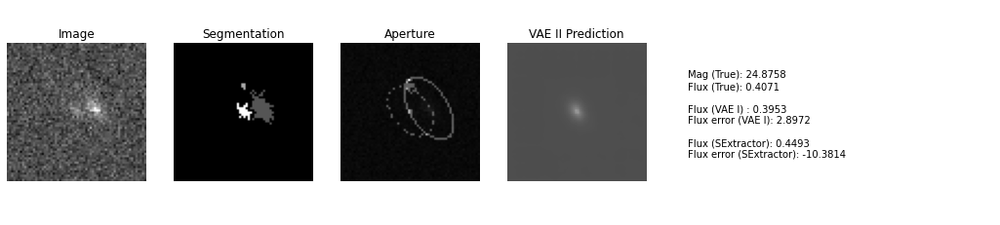

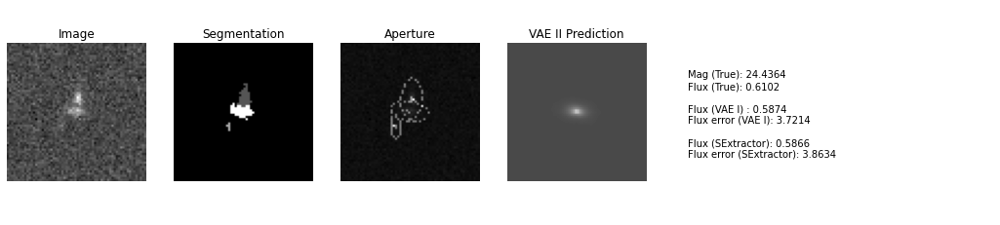

In [ ]:
pixel_scale = 0.1 

for n in cat_sext_test[(cat_sext_test['NO_OBJECTS'] > 2)].index.tolist()[20:40]: 

  ### SExtractor 

  fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(14.8, 4))

  im1 = ax0.imshow(sext_X_test_img[n], cmap='gray')
  ax0.set_title('Image')
  ax0.axis('off')

  im2 = ax1.imshow(sext_X_test_seg[n], cmap='gray')
  ax1.set_title('Segmentation')
  ax1.axis('off')

  im3 = ax2.imshow(sext_X_test_apr[n], cmap='gray')
  ax2.set_title('Aperture')
  ax2.axis('off')

  im4 = ax3.imshow(Y_test_predict[n], cmap='gray')
  ax3.set_title('VAE II Prediction')
  ax3.axis('off')

  images = [im1, im4]
  vmin = np.min([image.get_array().min() for image in images])
  vmax = np.max([image.get_array().max() for image in images])
  norm = colors.Normalize(vmin=vmin, vmax=vmax)
  for im in images:
      im.set_norm(norm)

  catalog_mag = cat_test.iloc[n, 4]
  catalog_flux = MagToFlux(zp, catalog_mag)
  catalog_rad = cat_test.iloc[n, 7]*pixel_scale

  vae_flux = np.sum(Y_test_predict[n])
  vae_mag = FluxToMag(zp, vae_flux)

  vae_error_flux = (catalog_flux-vae_flux)*100/catalog_flux
  vae_error_mag = (catalog_mag-vae_mag)*100/catalog_mag

  sext_flux = cat_sext_test.loc[n, 'SEXT_BKG_CORRECT_FLUX']
  sext_error_flux = (catalog_flux-sext_flux)*100/catalog_flux
  sext_n = cat_sext_test.loc[n, 'NO_OBJECTS']

  if sext_flux == 0: 
    sext_mag = None
    sext_error_mag = None 
  else: 
    sext_mag = FluxToMag(zp, sext_flux)
    sext_error_mag = (catalog_mag-sext_mag)*100/catalog_mag

  info = f"Mag (True): {format(catalog_mag, '.4f')}\nFlux (True): {format(catalog_flux, '.4f')}\n\nFlux (VAE I) : {format(vae_flux, '.4f')}\nFlux error (VAE I): {format(vae_error_flux, '.4f')}\n\nFlux (SExtractor): {format(sext_flux, '.4f')}\nFlux error (SExtractor): {format(sext_error_flux, '.4f')}"

  left, width = 0, 3.5
  bottom, height = 0.18, 0.66
  right = left + width
  top = bottom + height
  p = plt.Rectangle((left, bottom), width, height, fill=False, linewidth=0)
  p.set_transform(ax3.transAxes)
  p.set_clip_on(False)
  ax4.add_patch(p)
  ax4.axis('off')

  ax4.text(left+0.1, top-0.35, info,
        horizontalalignment='left',
        verticalalignment='center',
        transform=ax4.transAxes)

  ax4.axis('off')

  plt.show()

## When NO_OBJECTS == 2
VAE better than SExtractor

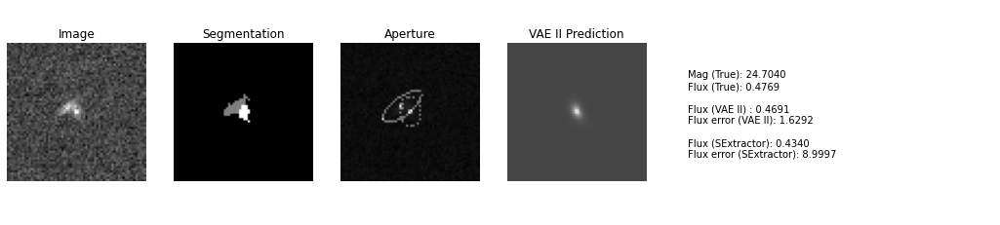

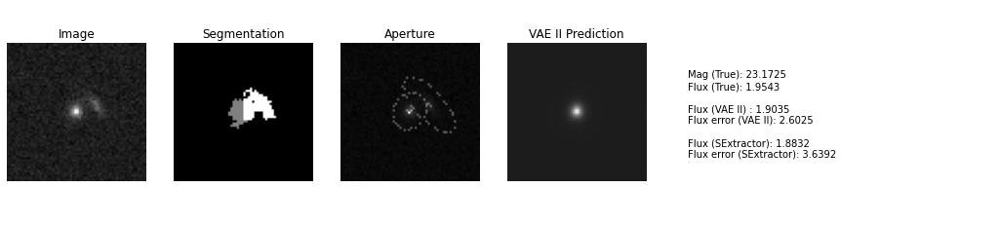

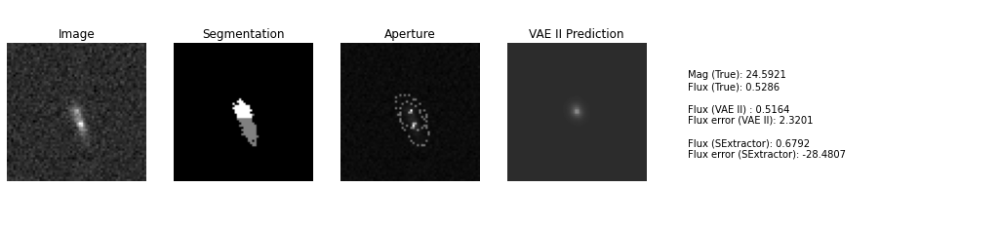

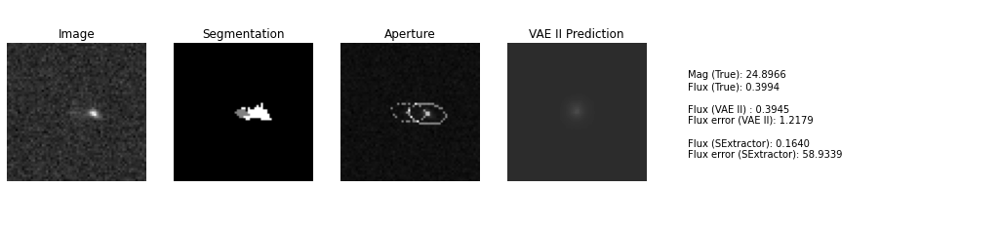

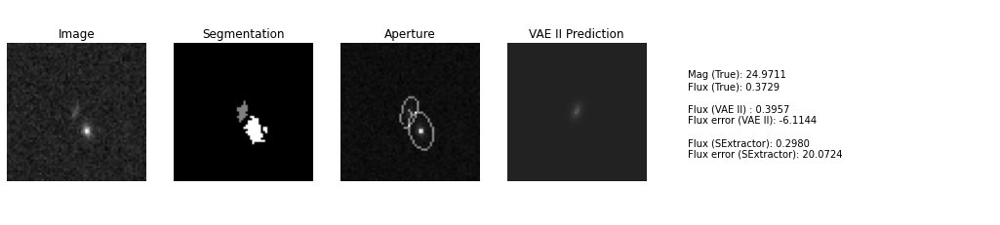

...

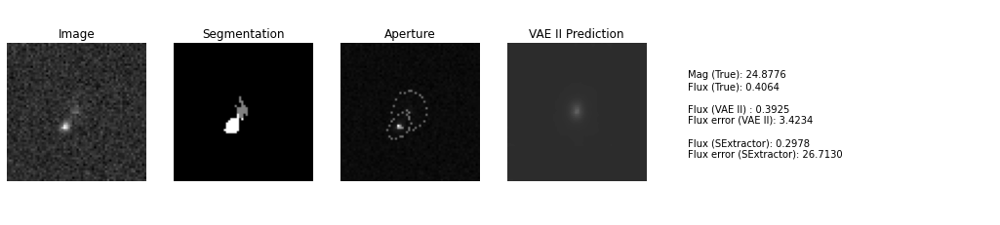

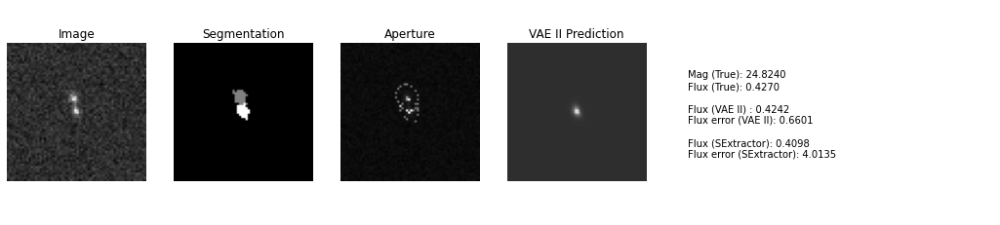

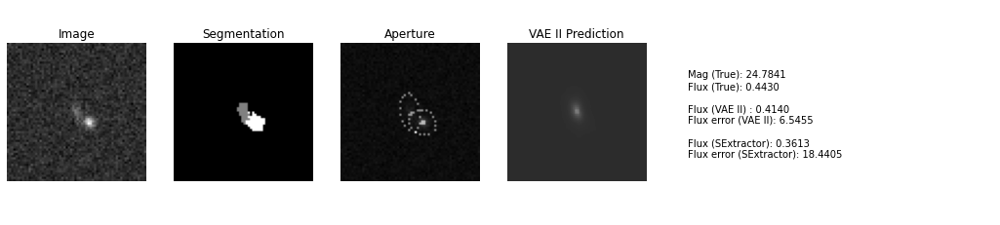

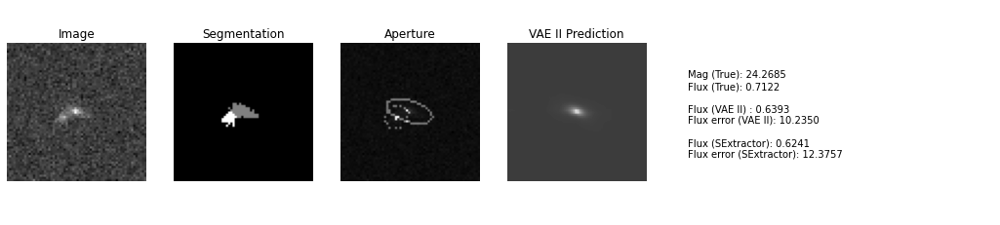

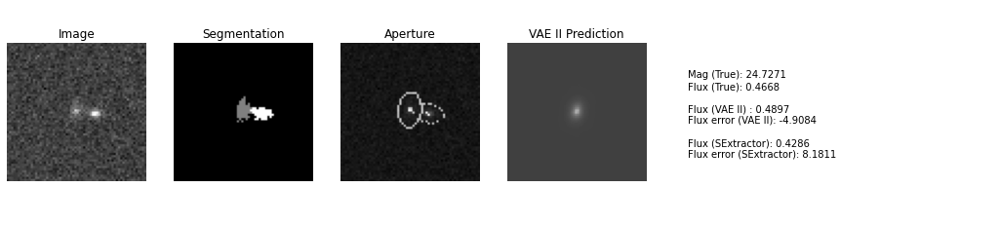

In [ ]:
pixel_scale = 0.1 

for n in cat_sext_test[(np.absolute(cat_sext_test['ERROR_SEXT']) > np.absolute(cat_sext_test['ERROR_VAE'])) & (cat_sext_test['NO_OBJECTS'] == 2)].index.tolist()[:20]: 

  ### SExtractor 

  fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(14.8, 4))

  im1 = ax0.imshow(sext_X_test_img[n], cmap='gray')
  ax0.set_title('Image')
  ax0.axis('off')

  im2 = ax1.imshow(sext_X_test_seg[n], cmap='gray')
  ax1.set_title('Segmentation')
  ax1.axis('off')

  im3 = ax2.imshow(sext_X_test_apr[n], cmap='gray')
  ax2.set_title('Aperture')
  ax2.axis('off')

  im4 = ax3.imshow(Y_test_predict[n], cmap='gray')
  ax3.set_title('VAE II Prediction')
  ax3.axis('off')

  images = [im1, im4]
  vmin = np.min([image.get_array().min() for image in images])
  vmax = np.max([image.get_array().max() for image in images])
  norm = colors.Normalize(vmin=vmin, vmax=vmax)
  for im in images:
      im.set_norm(norm)

  catalog_mag = cat_test.iloc[n, 4]
  catalog_flux = MagToFlux(zp, catalog_mag)
  catalog_rad = cat_test.iloc[n, 7]*pixel_scale

  vae_flux = np.sum(Y_test_predict[n])
  vae_mag = FluxToMag(zp, vae_flux)

  vae_error_flux = (catalog_flux-vae_flux)*100/catalog_flux
  vae_error_mag = (catalog_mag-vae_mag)*100/catalog_mag

  sext_flux = cat_sext_test.loc[n, 'SEXT_BKG_CORRECT_FLUX']
  sext_error_flux = (catalog_flux-sext_flux)*100/catalog_flux
  sext_n = cat_sext_test.loc[n, 'NO_OBJECTS']

  if sext_flux == 0: 
    sext_mag = None
    sext_error_mag = None 
  else: 
    sext_mag = FluxToMag(zp, sext_flux)
    sext_error_mag = (catalog_mag-sext_mag)*100/catalog_mag

  info = f"Mag (True): {format(catalog_mag, '.4f')}\nFlux (True): {format(catalog_flux, '.4f')}\n\nFlux (VAE I) : {format(vae_flux, '.4f')}\nFlux error (VAE I): {format(vae_error_flux, '.4f')}\n\nFlux (SExtractor): {format(sext_flux, '.4f')}\nFlux error (SExtractor): {format(sext_error_flux, '.4f')}"

  left, width = 0, 3.5
  bottom, height = 0.18, 0.66
  right = left + width
  top = bottom + height
  p = plt.Rectangle((left, bottom), width, height, fill=False, linewidth=0)
  p.set_transform(ax3.transAxes)
  p.set_clip_on(False)
  ax4.add_patch(p)
  ax4.axis('off')

  ax4.text(left+0.1, top-0.35, info,
        horizontalalignment='left',
        verticalalignment='center',
        transform=ax4.transAxes)

  ax4.axis('off')

  plt.show()

## When NO_OBJECTS == 2
SExtractor better than VAE

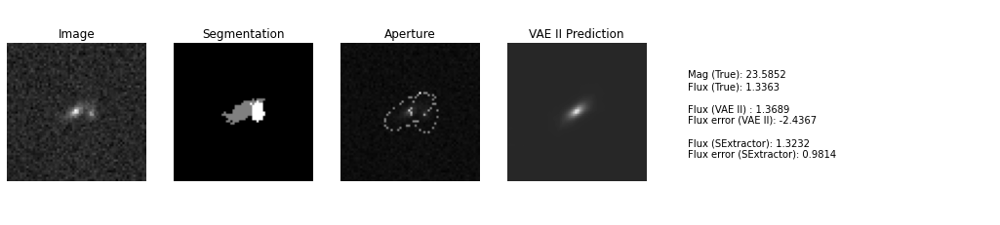

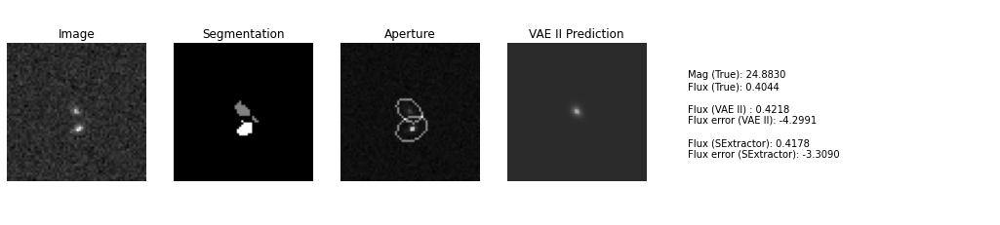

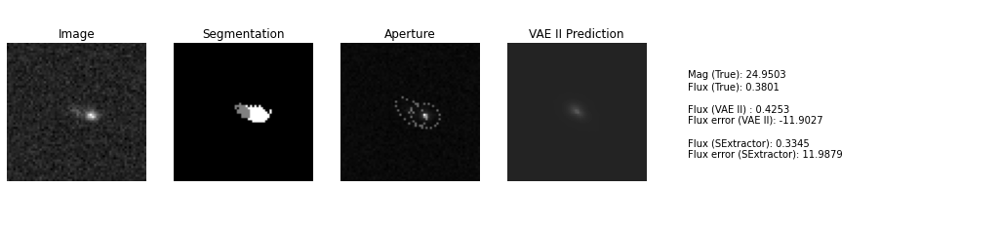

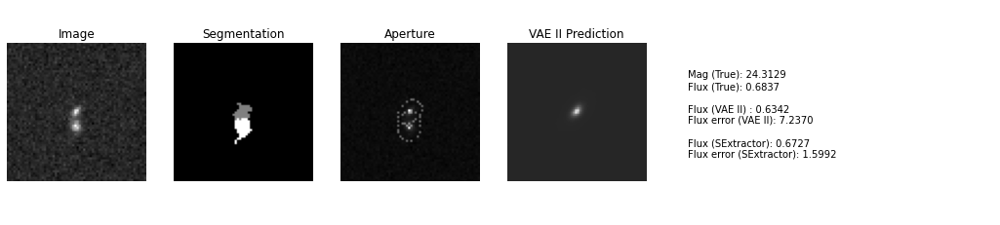

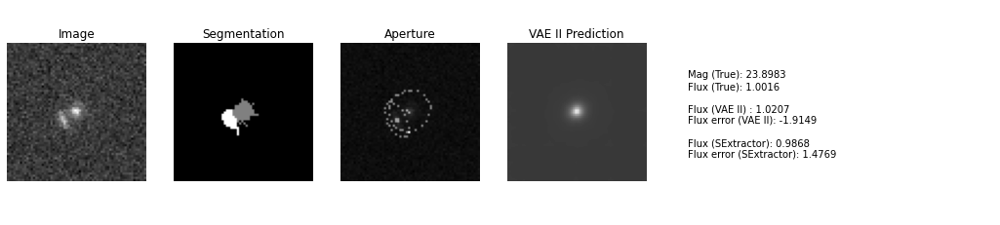

...

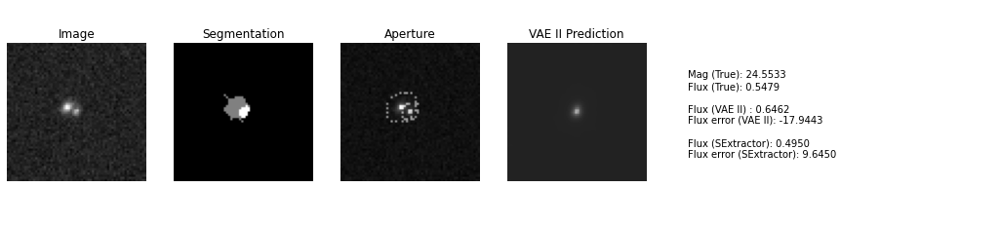

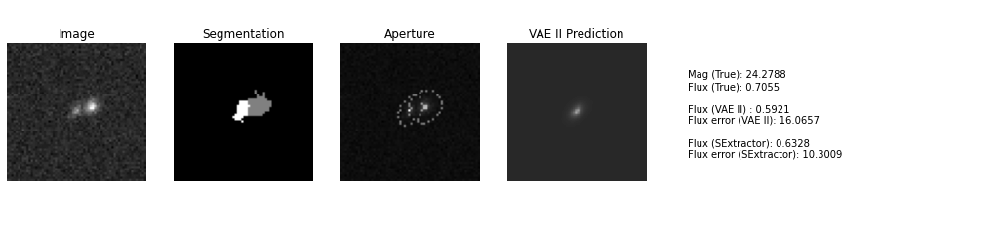

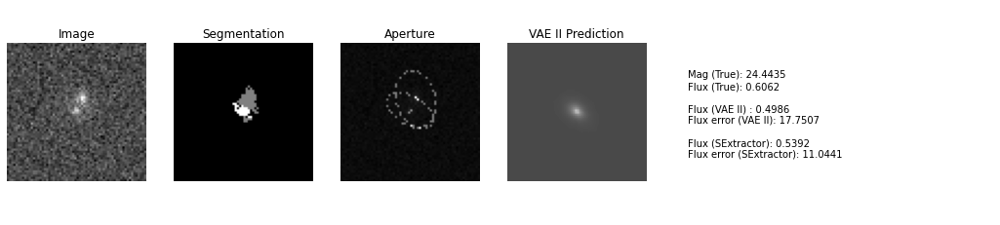

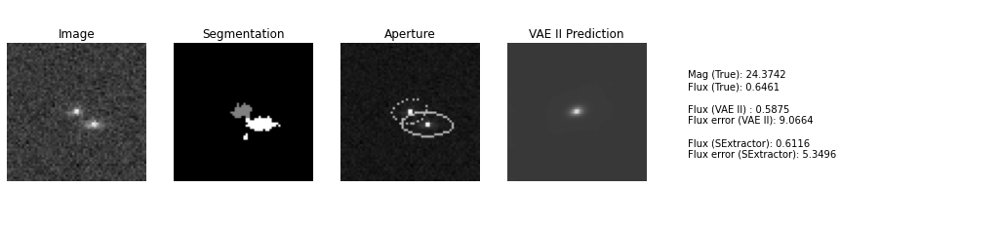

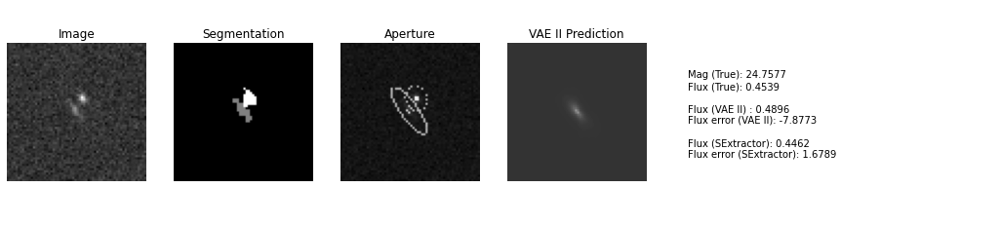

In [ ]:
pixel_scale = 0.1 

for n in cat_sext_test[(np.absolute(cat_sext_test['ERROR_SEXT']) < np.absolute(cat_sext_test['ERROR_VAE'])) & (cat_sext_test['NO_OBJECTS'] == 2)].index.tolist()[:20]: 

  ### SExtractor 

  fig, (ax0, ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=5, figsize=(14.8, 4))

  im1 = ax0.imshow(sext_X_test_img[n], cmap='gray')
  ax0.set_title('Image')
  ax0.axis('off')

  im2 = ax1.imshow(sext_X_test_seg[n], cmap='gray')
  ax1.set_title('Segmentation')
  ax1.axis('off')

  im3 = ax2.imshow(sext_X_test_apr[n], cmap='gray')
  ax2.set_title('Aperture')
  ax2.axis('off')

  im4 = ax3.imshow(Y_test_predict[n], cmap='gray')
  ax3.set_title('VAE II Prediction')
  ax3.axis('off')

  images = [im1, im4]
  vmin = np.min([image.get_array().min() for image in images])
  vmax = np.max([image.get_array().max() for image in images])
  norm = colors.Normalize(vmin=vmin, vmax=vmax)
  for im in images:
      im.set_norm(norm)

  catalog_mag = cat_test.iloc[n, 4]
  catalog_flux = MagToFlux(zp, catalog_mag)
  catalog_rad = cat_test.iloc[n, 7]*pixel_scale

  vae_flux = np.sum(Y_test_predict[n])
  vae_mag = FluxToMag(zp, vae_flux)

  vae_error_flux = (catalog_flux-vae_flux)*100/catalog_flux
  vae_error_mag = (catalog_mag-vae_mag)*100/catalog_mag

  sext_flux = cat_sext_test.loc[n, 'SEXT_BKG_CORRECT_FLUX']
  sext_error_flux = (catalog_flux-sext_flux)*100/catalog_flux
  sext_n = cat_sext_test.loc[n, 'NO_OBJECTS']

  if sext_flux == 0: 
    sext_mag = None
    sext_error_mag = None 
  else: 
    sext_mag = FluxToMag(zp, sext_flux)
    sext_error_mag = (catalog_mag-sext_mag)*100/catalog_mag

  info = f"Mag (True): {format(catalog_mag, '.4f')}\nFlux (True): {format(catalog_flux, '.4f')}\n\nFlux (VAE I) : {format(vae_flux, '.4f')}\nFlux error (VAE I): {format(vae_error_flux, '.4f')}\n\nFlux (SExtractor): {format(sext_flux, '.4f')}\nFlux error (SExtractor): {format(sext_error_flux, '.4f')}"

  left, width = 0, 3.5
  bottom, height = 0.18, 0.66
  right = left + width
  top = bottom + height
  p = plt.Rectangle((left, bottom), width, height, fill=False, linewidth=0)
  p.set_transform(ax3.transAxes)
  p.set_clip_on(False)
  ax4.add_patch(p)
  ax4.axis('off')

  ax4.text(left+0.1, top-0.35, info,
        horizontalalignment='left',
        verticalalignment='center',
        transform=ax4.transAxes)

  ax4.axis('off')

  plt.show()

# T-SNE Visulization of latent space

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
from tensorflow.keras import backend as K

layerIndex = 9
func = K.function([vae_model.get_layer(index=0).input], vae_model.get_layer(index=layerIndex).output)
layerOutput = func(np.expand_dims(X_test, axis=-1))  # input_data is a numpy array

print(layerOutput.shape)

(30767, 100)


In [ ]:
ls = TSNE(n_components=2).fit_transform(layerOutput)
ls.shape

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(30767, 2)

Text(0, 0.5, 'Dim 2')

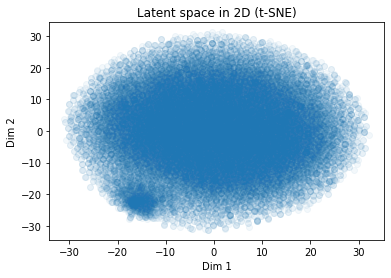

In [ ]:
plt.scatter(ls[:,0],ls[:,1], alpha=0.05)
plt.title(f'Latent space in 2D (t-SNE)')
plt.xlabel('Dim 1')
plt.ylabel('Dim 2')